# Import and settings

In [1]:
%load_ext autoreload
%autoreload 2

import os, re, gc, joblib

import numpy as np
import numpy_groupies as npg
import scipy.sparse as sp
import pandas as pd
from sklearn.preprocessing import minmax_scale

import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import ListedColormap, LogNorm

import seaborn as sn

import anndata

import scanpy as sc
import sctk as sk

import torch
import scvi

Global seed set to 0
/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/chex/_src/pytypes.py:37: FutureWarning: jax.tree_structure is deprecated, and will be removed in a future release. Use jax.tree_util.tree_structure instead.
  PyTreeDef = type(jax.tree_structure(None))


In [2]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)

In [3]:
rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42
expr_cmap = sk.expression_colormap()
np.set_printoptions(linewidth=150)
sc.settings.verbosity = 0
sk.set_figsize((4, 4))
torch.cuda.set_device(1)

PYTHON = "/software/team205/miniconda3/envs/rapids-torch/bin/python"

%cd ~/scratch/20220125_digestive_tract_integration/v2/

/lustre/scratch117/cellgen/team205/nh3/20220125_digestive_tract_integration/v2


# Functions

In [4]:
def run_mde(
    data,
    n_neighbors=15,
    random_state=0,
    **kwargs,
):
    """
    Util to run :func:`pymde.preserve_neighbors` for visualization of scvi-tools embeddings.

    Parameters
    ----------
    data
        The data of shape (n_obs, k), where k is typically defined by one of the models
        in scvi-tools that produces an embedding (e.g., :class:`~scvi.model.SCVI`.)
    n_neighbors
        Number of nearest neighbors, if set to None, a sensible number will be chosen according
        to the number of observations in `data`.
    random_state
        Random seed passed to mde for reproducibility
    kwargs
        Keyword args to :func:`pymde.preserve_neighbors`
    Returns
    -------
    The pymde embedding, defaults to two dimensions.

    Notes
    -----
    This function is a modification of scvi.model.utils.mde().

    If you use this function in your research please cite:

    Agrawal, Akshay, Alnur Ali, and Stephen Boyd. "Minimum-distortion embedding." arXiv preprint arXiv:2103.02559 (2021).
    """
    try:
        import pymde
        import torch
    except ImportError:
        raise ImportError("Please install pymde package via `pip install pymde`")

    if isinstance(data, pd.DataFrame):
        data = data.values

    device = "cuda"

    _kwargs = dict(
        embedding_dim=2,
        constraint=pymde.Standardized(),
        repulsive_fraction=0.5,
        verbose=False,
        device=device,
        n_neighbors=n_neighbors,
    )
    _kwargs.update(kwargs)

    pymde.seed(random_state)
    mde = pymde.preserve_neighbors(data, **_kwargs)

    return mde

In [5]:
def mde_embed(mde):
    emb = mde.embed(verbose=False)

    emb = emb.cpu().numpy()

    return emb

In [6]:
def mde_neighbors(mde, n):
    edges = mde.edges.cpu().numpy()
    weights = mde.distortion_function.weights.cpu().numpy()

    connectivities = sp.csr_matrix(
        (np.ones(weights.size), (edges[:, 0], edges[:, 1])), shape=(n, n)
    )
    distances = sp.csr_matrix((weights, (edges[:, 0], edges[:, 1])), shape=(n, n))

    return connectivities, distances

In [7]:
def rapids_leiden(
    ad, neighbors_key="neighbors", resolution=0.5, restrict_to=None, key_added=None
):
    from natsort import natsorted
    from scanpy._utils import _choose_graph
    from scanpy.tools._utils_clustering import restrict_adjacency, rename_groups
    import cudf, cugraph

    adjacency = _choose_graph(ad, None, neighbors_key)
    if restrict_to is not None:
        restrict_key, restrict_categories = restrict_to
        adjacency, restrict_indices = restrict_adjacency(
            ad,
            restrict_key,
            restrict_categories,
            adjacency,
        )

    offsets = cudf.Series(adjacency.indptr)
    indices = cudf.Series(adjacency.indices)
    g = cugraph.Graph()
    g.from_cudf_adjlist(offsets, indices, None)
    leiden_parts, modularity_score = cugraph.leiden(g, resolution=resolution)
    groups = (
        leiden_parts.to_pandas().sort_values("vertex")[["partition"]].to_numpy().ravel()
    )
    if restrict_to is not None:
        groups = rename_groups(
            ad,
            key_added,
            restrict_key,
            restrict_categories,
            restrict_indices,
            groups,
        )
    ad.obs[key_added] = pd.Categorical(
        values=groups.astype("U"), categories=natsorted(map(str, np.unique(groups)))
    )

# Load data

In [8]:
MAPPED_DATA_ROOT = "/lustre/scratch117/cellgen/cellgeni/TIC-starsolo"
CB_RERUN_ROOT = "h5ad/cellbender"

REMOTE_METADATA_URL = "https://docs.google.com/spreadsheets/d/1U9YrzE3yqSGu6wXL_1HZn4P51ChCXXcOF9SBJ5ubdX4"
REMOTE_METADATA_SHEET_NAME = "sample_metadata_20220811"

LOCAL_METADATA_CSV = "metadata/sample_metadata.csv"

CB_RERUN_SUMMARY_TSV = "metadata/cellbender_rerun_samples.results.tsv"

In [9]:
metadata = pd.read_csv(LOCAL_METADATA_CSV, index_col=0)

In [10]:
healthy_metadata = metadata[metadata.include_150722 == "healthy_reference"]
disease_metadata = metadata[metadata.include_150722 == "disease"]

In [11]:
CC_GENE_LIST = "feature_list/JP_cycle_genes.list"
IG_GENE_LIST = "feature_list/ig_genes.list"
TCR_GENE_LIST = "feature_list/tcr_genes.list"

In [12]:
cc_genes = pd.read_csv(CC_GENE_LIST, header=None, names=["gene"]).gene
ig_genes = pd.read_csv(IG_GENE_LIST, header=None, names=["gene"]).gene
tcr_genes = pd.read_csv(TCR_GENE_LIST, header=None, names=["gene"]).gene

igc_genes = [g for g in ig_genes if re.search(r"^IGH[ADEMG][0-9]*$", g)]
ig_genes = ig_genes[~ig_genes.isin(igc_genes)]

In [ ]:
cb_rerun_df = pd.read_csv(
    CB_RERUN_SUMMARY_TSV,
    sep="\t",
    index_col=0,
    names=["choice", "quality", "comments", "action"],
)

# Process

## Gather matrices

In [21]:
gather_script = "pyscript/gather_matrices.py"
gather_job_script = "shscript/run_gather_matrices.sh"
regather_job_script = "shscript/rerun_gather_matrices.sh"

In [14]:
with open(gather_job_script, "w") as f:
    for i, row in metadata.iterrows():
        sid = row.sampleID
        print(f"{PYTHON} {gather_script} {LOCAL_METADATA_CSV} {sid}", file=f)

In [22]:
with open(regather_job_script, "w") as f:
    for sid in cb_rerun_df.index:
        if cb_rerun_df.loc[sid, "choice"] in ("2", "3"):
            print(
                f"{PYTHON} {gather_script} --force --rerun-cb {CB_RERUN_SUMMARY_TSV} {LOCAL_METADATA_CSV} {sid}",
                file=f,
            )

In [25]:
n_regather = !cat {regather_job_script} | wc -l

In [29]:
!jsub lsf -n gather -q normal -c 1 -m 8g -a "[1-{int(n_regather[0])}:5]" -l log/gather -s {regather_job_script} | bsub

Job <64306> is submitted to queue <normal>.


In [37]:
!bjobs

No unfinished job found


## Check cellbender outputs

In [11]:
for i, row in metadata.iterrows():
    sid = row.sampleID
    src_pdf = os.path.join(
        MAPPED_DATA_ROOT, row.cellbender_out.replace("_filtered.h5", ".pdf")
    )
    tgt_pdf = f"qc_plot/{sid}/{sid}.cellbender_out.pdf"
    src_log = os.path.join(
        MAPPED_DATA_ROOT, row.cellbender_out.replace("_filtered.h5", ".log")
    )
    # tgt_log = f"log/cellbender/{sid}.cellbender_out.log"
    os.makedirs(f"qc_plot/{sid}", exist_ok=True)
    # !cp {src_pdf} {tgt_pdf}
    !cp {src_log} {tgt_log}

## QC

In [38]:
qc_metrics = [
    "log1p_n_counts",
    "log1p_n_genes",
    "percent_mito",
    "percent_ribo",
    "percent_hb",
    "percent_top50",
    "percent_soup",
    "percent_spliced",
]

In [39]:
celltypist_models = {
    "cecilia22_predH": "Immune_All_High.pkl",
    "cecilia22_predL": "Immune_All_Low.pkl",
    "elmentaite21_pred": "Cells_Intestinal_Tract.pkl",
    "suo22_pred": "Pan_Fetal_Human.pkl",
}
ctp_model_str = ",".join([f"{name}:{mod}" for name, mod in celltypist_models.items()])

In [45]:
qc_script = "pyscript/qc.py"
qc_job_script = "shscript/run_qc.sh"
reqc_job_script = "shscript/rerun_qc.sh"

In [16]:
with open(qc_job_script, "w") as f:
    for i, row in metadata.iterrows():
        sid = row.sampleID
        print(
            f"{PYTHON} {qc_script} --qc_metrics {','.join(qc_metrics)} --clst_res 0.2 --min_frac 0.5 --models {ctp_model_str} {sid}",
            file=f,
        )

In [47]:
with open(reqc_job_script, "w") as f:
    for sid in cb_rerun_df.index:
        if cb_rerun_df.loc[sid, "choice"] in ("2", "3"):
            print(
                f"{PYTHON} {qc_script} --qc_metrics {','.join(qc_metrics)} --clst_res 0.2 --min_frac 0.5 --models {ctp_model_str} {sid}",
                file=f,
            )

In [49]:
n_reqc = !cat {reqc_job_script} | wc -l

In [51]:
!jsub lsf -n qc -q normal -c 1 -m 8g -a "[1-{int(n_reqc[0])}:10]" -s {reqc_job_script} -l log/qc

#!/usr/bin/env bash
#BSUB -J 'qc[1-94:10]'
#BSUB -q normal
#BSUB -n 1
#BSUB -M 8000
#BSUB -R 'span[hosts=1] select[mem>8000] rusage[mem=8000]'
#BSUB -o 'log/qc/qc.%J.%I.out'
#BSUB -e 'log/qc/qc.%J.%I.err'

awk -v begin=$LSB_JOBINDEX -v step=10 'NR>=begin && NR<begin+step {print}' shscript/rerun_qc.sh | bash


In [52]:
!jsub lsf -n qc -q normal -c 1 -m 8g -a "[1-{int(n_reqc[0])}:10]" -s {reqc_job_script} -l log/qc | bsub

Job <74569> is submitted to queue <normal>.


In [54]:
!bjobs | grep RUN

74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[1]      Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[11]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[21]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[31]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[41]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[51]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[61]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[71]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[81]     Sep  8 12:05
74569   nh3     RUN   normal     dgx-c11-02  node-13-08  qc[91]     Sep  8 12:05


## Pool

In [11]:
ads = []
for sid in healthy_metadata.sampleID:
    print(sid)
    ads.append(sc.read(f"h5ad/post_qc/{sid}.gene_velo_cellbender.post_qc.h5ad"))

GSM4600896
GSM4600897
HCA_A_GT12934997
HCA_A_GT12934998
HCA_A_GT12934999
HCA_A_GT12935000
HCA_A_GT12935002
HCA_A_GT12935004
HCA_A_GT12935005
HCA_A_GT12935007
GSM5683602
GSM5464615
GSM5464616
GSM5464617
GSM5464618
Pan_T7917816
Pan_T7917821
Pan_T7917827
Pan_T7935490
Pan_T7980366
Pan_T7980368
Pan_T7991584
Pan_T7991585
Pan_T7991586
Pan_T8010319
Pan_T8010320
4918STDY7274839
4918STDY7317585
4918STDY7317586
4918STDY7317587
4918STDY7321513
4918STDY7321514
4918STDY7321515
4918STDY7333456
4918STDY7389431
4918STDY7421297
4918STDY7421298
4918STDY7421299
4918STDY7426904
4918STDY7426905
4918STDY7426906
4918STDY7426907
4918STDY7426908
4918STDY7426909
4918STDY7447825
4918STDY7693757
4918STDY7693758
4918STDY7693759
4918STDY7693760
4918STDY7693761
4918STDY7693762
4918STDY7693763
4918STDY7702679
4918STDY7702680
4918STDY7714149
4918STDY7714150
4918STDY7717783
4918STDY7717784
4918STDY7717785
4918STDY7717787
4918STDY7717788
4918STDY7717789
4918STDY7718972
4918STDY7718973
4918STDY7718974
4918STDY7718975
4918

In [12]:
len(ads)

386

In [13]:
pooled_ad = anndata.AnnData.concatenate(
    *ads, batch_key="sampleID", batch_categories=healthy_metadata.sampleID.to_list()
)

In [14]:
del ads
gc.collect()

94954

In [15]:
for suffix in ("", "_raw", "_spliced", "_unspliced"):
    pooled_ad.var[f"n_counts{suffix}"] = pooled_ad.var[
        [f"n_counts{suffix}-{sid}" for sid in healthy_metadata.sampleID]
    ].sum(axis=1)

for suffix in ("", "_raw", "_spliced", "_unspliced"):
    pooled_ad.varm[f"n_counts{suffix}"] = pooled_ad.var[
        [f"n_counts{suffix}-{sid}" for sid in healthy_metadata.sampleID]
    ].values

for suffix in ("", "_raw", "_spliced", "_unspliced"):
    for sid in healthy_metadata.sampleID:
        del pooled_ad.var[f"n_counts{suffix}-{sid}"]

In [16]:
for suffix in ("", "_raw", "_spliced", "_unspliced"):
    pooled_ad.var[f"n_cells{suffix}"] = pooled_ad.var[
        [f"n_cells{suffix}-{sid}" for sid in healthy_metadata.sampleID]
    ].sum(axis=1)

for suffix in ("", "_raw", "_spliced", "_unspliced"):
    pooled_ad.varm[f"n_cells{suffix}"] = pooled_ad.var[
        [f"n_cells{suffix}-{sid}" for sid in healthy_metadata.sampleID]
    ].values

for suffix in ("", "_raw", "_spliced", "_unspliced"):
    for sid in healthy_metadata.sampleID:
        del pooled_ad.var[f"n_cells{suffix}-{sid}"]

In [17]:
pooled_ad

AnnData object with n_obs × n_vars = 1910334 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [18]:
pooled_ad.write(
    "h5ad/pooled/pooled_healthy.gene_velo_cellbender.post_qc.20220909.h5ad",
    compression="gzip",
)

... storing 'cecilia22_predH' as categorical
... storing 'cecilia22_predH_uncertain' as categorical
... storing 'cecilia22_predL' as categorical
... storing 'cecilia22_predL_uncertain' as categorical
... storing 'elmentaite21_pred' as categorical
... storing 'elmentaite21_pred_uncertain' as categorical
... storing 'suo22_pred' as categorical
... storing 'suo22_pred_uncertain' as categorical
... storing 'qc_cluster' as categorical
... storing 'pass_default' as categorical


In [19]:
pooled_ad0 = anndata.AnnData(
    X=pooled_ad.X, obs=pooled_ad.obs.copy(), var=pooled_ad.var.copy()
)

In [20]:
del pooled_ad
gc.collect()

0

In [21]:
(pooled_ad0.obs.good_qc_cluster <= 80).sum()

1330661

In [22]:
healthy_metadata.columns

Index(['Order', 'sampleID', 'sourceID', 'donorID_original', 'study',
       'donorID_corrected', 'donorID_unified', 'donor_category',
       'donor_disease', 'organ_original', 'organ_unified', 'organ_broad',
       'age_original', 'age_unified', 'age_continuousadult',
       'age_continuousdev', 'sex', 'sample_type',
       'TEMPORARY - helping Amanda with sample_category', 'sample_category',
       'sample_retrieval', 'tissue_fraction', 'cell_fraction',
       'cell_fraction_unified', 'cell_sorting', 'technology', 'include_150722',
       'starsolo_out', 'cellbender_out'],
      dtype='object')

In [23]:
obs_df = (
    pooled_ad0.obs.reset_index()
    .merge(
        healthy_metadata.drop(
            columns=[
                "Order",
                "TEMPORARY - helping Amanda with sample_category",
                "starsolo_out",
                "cellbender_out",
            ]
        ),
        how="left",
        left_on="sampleID",
        right_on="sampleID",
    )
    .set_index("index")
)

In [24]:
(obs_df.index == pooled_ad0.obs_names).all()

True

In [25]:
pooled_ad0.obs = obs_df

In [26]:
pooled_ad0.var["cc"] = pooled_ad0.var_names.isin(cc_genes)
pooled_ad0.var["ig"] = pooled_ad0.var_names.isin(ig_genes)
pooled_ad0.var["tcr"] = pooled_ad0.var_names.isin(tcr_genes)

In [27]:
pooled_ad0

AnnData object with n_obs × n_vars = 1910334 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [28]:
sk.clear_colors(pooled_ad0)
pooled_ad0.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.post_qc.20220909.h5ad",
    compression="gzip",
)

... storing 'sampleID' as categorical
... storing 'sourceID' as categorical
... storing 'donorID_original' as categorical
... storing 'study' as categorical
... storing 'donorID_corrected' as categorical
... storing 'donorID_unified' as categorical
... storing 'donor_category' as categorical
... storing 'donor_disease' as categorical
... storing 'organ_original' as categorical
... storing 'organ_unified' as categorical
... storing 'organ_broad' as categorical
... storing 'age_original' as categorical
... storing 'age_unified' as categorical
... storing 'age_continuousadult' as categorical
... storing 'sex' as categorical
... storing 'sample_type' as categorical
... storing 'sample_category' as categorical
... storing 'sample_retrieval' as categorical
... storing 'tissue_fraction' as categorical
... storing 'cell_fraction' as categorical
... storing 'cell_fraction_unified' as categorical
... storing 'cell_sorting' as categorical
... storing 'technology' as categorical
... storing 'inclu

## Sample QC

In [8]:
pooled_ad0 = sc.read("h5ad/pooled/pooled_healthy.gene_cellbender.post_qc.20220909.h5ad")

In [9]:
sample_passqc_df = pd.concat(
    [
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito80.mean()
        ),
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito50.mean()
        ),
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito20.mean()
        ),
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito80.sum()
        ),
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito50.sum()
        ),
        pooled_ad0.obs.groupby("sampleID").apply(
            lambda df: df.good_qc_cluster_mito20.sum()
        ),
        pooled_ad0.obs.sampleID.value_counts(sort=False),
        pooled_ad0.obs[["sampleID", "study"]].drop_duplicates().set_index("sampleID"),
    ],
    axis=1,
).rename(
    columns={
        0: "passQC_frac80",
        1: "passQC_frac50",
        2: "passQC_frac20",
        3: "passQC_count80",
        4: "passQC_count50",
        5: "passQC_count20",
        "sampleID": "total_cell_count",
    }
)

In [11]:
sample_passqc_df.head()

,passQC_frac80,passQC_frac50,passQC_frac20,passQC_count80,passQC_count50,passQC_count20,total_cell_count,study
5-Int-Fresh-Unsorted,0.963508,0.963508,0.963508,6548,6548,6548,6796,Holloway2021
6-Int-Fresh-Sorted,0.996393,0.996393,0.996393,7735,7735,7735,7763,Holloway2021
4861STDY7135911,0.916020,0.916020,0.916020,2716,2716,2716,2965,James2020
4861STDY7135912,0.904241,0.904241,0.904241,3305,3305,3305,3655,James2020
4861STDY7135913,0.969802,0.969802,0.969802,3083,3083,3083,3179,James2020


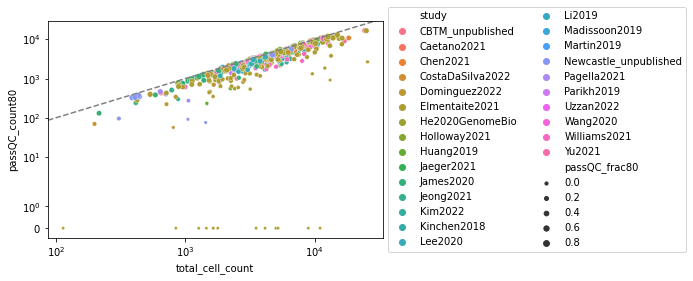

In [12]:
sk.set_figsize((5, 5))
ax = sn.scatterplot(
    data=sample_passqc_df,
    x="total_cell_count",
    y="passQC_count80",
    hue="study",
    size="passQC_frac80",
    sizes=(10, 40),
)
ax.set_xscale("symlog")
ax.set_yscale("symlog")
ax.axline((1e3, 1e3), (1e4, 1e4), c="grey", linestyle="--")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=2);

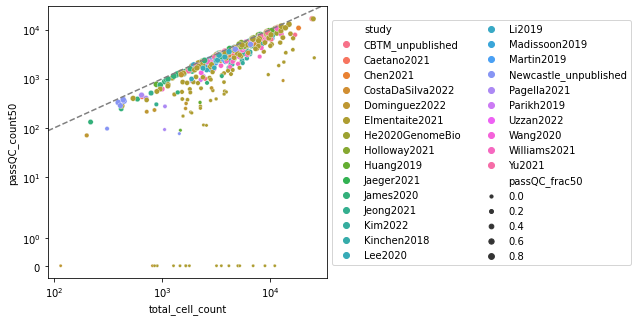

In [13]:
sk.set_figsize((5, 5))
ax = sn.scatterplot(
    data=sample_passqc_df,
    x="total_cell_count",
    y="passQC_count50",
    hue="study",
    size="passQC_frac50",
    sizes=(10, 40),
)
ax.set_xscale("symlog")
ax.set_yscale("symlog")
ax.axline((1e3, 1e3), (1e4, 1e4), c="grey", linestyle="--")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=2);

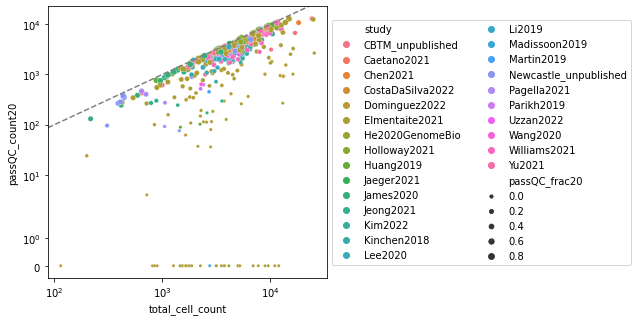

In [14]:
sk.set_figsize((5, 5))
ax = sn.scatterplot(
    data=sample_passqc_df,
    x="total_cell_count",
    y="passQC_count20",
    hue="study",
    size="passQC_frac20",
    sizes=(10, 40),
)
ax.set_xscale("symlog")
ax.set_yscale("symlog")
ax.axline((1e3, 1e3), (1e4, 1e4), c="grey", linestyle="--")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=2);

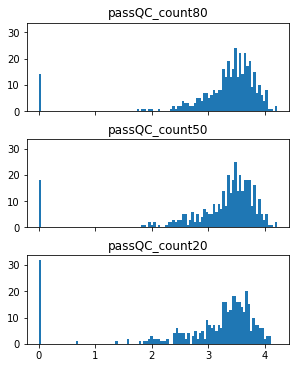

In [15]:
sk.set_figsize((4, 5))
fig, axs = plt.subplots(
    nrows=3, ncols=1, sharex=True, sharey=True, constrained_layout=True
)
for i, name in enumerate(["passQC_count80", "passQC_count50", "passQC_count20"]):
    axs[i].hist(np.log10(1 + sample_passqc_df[name].values), 100)
    axs[i].set_title(name)

In [16]:
samples_to_check1 = sample_passqc_df.index.to_series()[
    sample_passqc_df.passQC_count20 > 10000
].to_list()

In [18]:
healthy_metadata[healthy_metadata.sampleID.isin(samples_to_check1)].reset_index(
    drop=True
)

,Order,sampleID,sourceID,donorID_original,study,donorID_corrected,donorID_unified,donor_category,donor_disease,organ_original,...,sample_category,sample_retrieval,tissue_fraction,cell_fraction,cell_fraction_unified,cell_sorting,technology,include_150722,starsolo_out,cellbender_out
0,10,HCA_A_GT12935007,CBTM,A68_770C,CBTM_unpublished,A68_770C,D99,control,organ_donor,ileum,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/extra_samples/HCA_A_GT12935007/output,tic-1168/extra_samples/HCA_A_GT12935007.cellbe...
1,11,GSM5683602,GSE188478,GSM5683602,Chen2021,GSM5683602,D104,control,SCC_mandibular_gingiva,parotid gland,...,Neighbouring_cancer,Surgery,Full_thickness,Total,Total,None,10X_3pv3,healthy_reference,tic-1294/GSE188478/GSM5683602/output,tic-1294/GSE188478/GSM5683602.cellbender.out/c...
2,78,FCA_gut9456316,5p_sanger,BRC2258,Elmentaite2021,BRC2258,F13,inutero,organ_donor,ileum,...,Non_pathological,Medical_termination,Full_thickness,total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/FCA_gut9456316/output,tic-1168/Cellbender_out/FCA_gut9456316.cellben...
3,82,FCA_gut9456326,5p_sanger,BRC2259,Elmentaite2021,BRC2259,F14,inutero,organ_donor,duodenum,...,Non_pathological,Medical_termination,Full_thickness,total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/FCA_gut9456326/output,tic-1168/Cellbender_out/FCA_gut9456326.cellben...
4,155,Human_colon_16S8159187,5p_sanger,F73,Elmentaite2021,F73,F16,inutero,organ_donor,duodenum,...,Non_pathological,Medical_termination,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8159187/...,tic-1168/Cellbender_out/Human_colon_16S8159187...
5,156,Human_colon_16S8159188,5p_sanger,F73,Elmentaite2021,F73,F16,inutero,organ_donor,ileum,...,Non_pathological,Medical_termination,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8159188/...,tic-1168/Cellbender_out/Human_colon_16S8159188...
6,171,WTDAtest7844017,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,caecum,...,Non_pathological,DCD,Full_thickness,SC-45P,CD45P_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844017/output,tic-1168/Cellbender_out/WTDAtest7844017.cellbe...
7,367,GSM5177037,GSE164241,BM168,Williams2021,168_Williams2021,D84,control,control,buccal mucosa,...,Non_pathological,Oral sample,Mucosa,Total,Total,None,10X_3pv3,healthy_reference,tic-1168/Cellbender_in/GSM5177037/output,tic-1168/Cellbender_out/GSM5177037.cellbender....


In [10]:
samples_to_check2 = sample_passqc_df[
    (sample_passqc_df.passQC_frac80 < 0.1) & (sample_passqc_df.passQC_count80 < 100)
].index.to_list()

In [20]:
healthy_metadata[healthy_metadata.sampleID.isin(samples_to_check2)].reset_index(
    drop=True
)

,Order,sampleID,sourceID,donorID_original,study,donorID_corrected,donorID_unified,donor_category,donor_disease,organ_original,...,sample_category,sample_retrieval,tissue_fraction,cell_fraction,cell_fraction_unified,cell_sorting,technology,include_150722,starsolo_out,cellbender_out
0,22,Pan_T7991584,PIP,423C,Dominguez2022,A35_423C,D52,control,organ_donor,duodenum,...,Non_pathological,DCD,Full_thickness,MNC_ficoll,Ficoll_percoll,Density,10X_5p,healthy_reference,tic-1168/Cellbender_in/Pan_T7991584/output,tic-1168/Cellbender_out/Pan_T7991584.cellbende...
1,25,Pan_T8010319,PIP,428C,Dominguez2022,A37_428C,D53,control,organ_donor,duodenum,...,Non_pathological,DCD,Full_thickness,MNC_ficoll,Ficoll_percoll,Density,10X_5p,healthy_reference,tic-1168/Cellbender_in/Pan_T8010319/output,tic-1168/Cellbender_out/Pan_T8010319.cellbende...
2,120,Human_colon_16S8002566,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,sigmoid colon,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002566/...,tic-1168/Cellbender_out/Human_colon_16S8002566...
3,121,Human_colon_16S8002573,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,rectum,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002573/...,tic-1168/Cellbender_out/Human_colon_16S8002573...
4,122,Human_colon_16S8002574,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,MLN,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002574/...,tic-1168/Cellbender_out/Human_colon_16S8002574...
5,168,WTDAtest7844014,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,appendix,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844014/output,tic-1168/Cellbender_out/WTDAtest7844014.cellbe...
6,173,WTDAtest7844019,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,ileum,...,Non_pathological,DCD,Full_thickness,SC-45P,CD45P_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844019/output,tic-1168/Cellbender_out/WTDAtest7844019.cellbe...
7,175,WTDAtest7844021,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,ileum,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844021/output,tic-1168/Cellbender_out/WTDAtest7844021.cellbe...
8,176,WTDAtest7844022,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,jejunum,...,Non_pathological,DCD,Full_thickness,SC-45P,CD45P_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844022/output,tic-1168/Cellbender_out/WTDAtest7844022.cellbe...
9,177,WTDAtest7844023,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,jejunum,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844023/output,tic-1168/Cellbender_out/WTDAtest7844023.cellbe...


In [21]:
samples_to_check3 = sample_passqc_df[
    sample_passqc_df.passQC_count80 == 0
].index.to_list()

In [22]:
healthy_metadata[healthy_metadata.sampleID.isin(samples_to_check3)].reset_index(
    drop=True
)

,Order,sampleID,sourceID,donorID_original,study,donorID_corrected,donorID_unified,donor_category,donor_disease,organ_original,...,sample_category,sample_retrieval,tissue_fraction,cell_fraction,cell_fraction_unified,cell_sorting,technology,include_150722,starsolo_out,cellbender_out
0,25,Pan_T8010319,PIP,428C,Dominguez2022,A37_428C,D53,control,organ_donor,duodenum,...,Non_pathological,DCD,Full_thickness,MNC_ficoll,Ficoll_percoll,Density,10X_5p,healthy_reference,tic-1168/Cellbender_in/Pan_T8010319/output,tic-1168/Cellbender_out/Pan_T8010319.cellbende...
1,120,Human_colon_16S8002566,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,sigmoid colon,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002566/...,tic-1168/Cellbender_out/Human_colon_16S8002566...
2,121,Human_colon_16S8002573,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,rectum,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002573/...,tic-1168/Cellbender_out/Human_colon_16S8002573...
3,122,Human_colon_16S8002574,5p_sanger,A38 (432C),Elmentaite2021,A38_432C,D13,control,organ_donor,MLN,...,Non_pathological,DCD,Full_thickness,Total,Total,None,10X_5p,healthy_reference,tic-1168/Cellbender_in/Human_colon_16S8002574/...,tic-1168/Cellbender_out/Human_colon_16S8002574...
4,168,WTDAtest7844014,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,appendix,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844014/output,tic-1168/Cellbender_out/WTDAtest7844014.cellbe...
5,173,WTDAtest7844019,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,ileum,...,Non_pathological,DCD,Full_thickness,SC-45P,CD45P_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844019/output,tic-1168/Cellbender_out/WTDAtest7844019.cellbe...
6,175,WTDAtest7844021,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,ileum,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844021/output,tic-1168/Cellbender_out/WTDAtest7844021.cellbe...
7,176,WTDAtest7844022,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,jejunum,...,Non_pathological,DCD,Full_thickness,SC-45P,CD45P_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844022/output,tic-1168/Cellbender_out/WTDAtest7844022.cellbe...
8,177,WTDAtest7844023,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,jejunum,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844023/output,tic-1168/Cellbender_out/WTDAtest7844023.cellbe...
9,179,WTDAtest7844025,3p_sanger,414C,Elmentaite2021,A33_414C,D10,control,organ_donor,ascending colon,...,Non_pathological,DCD,Full_thickness,SC-45N,CD45N_MACS,MACS,10X_3pv2,healthy_reference,tic-1168/Cellbender_in/WTDAtest7844025/output,tic-1168/Cellbender_out/WTDAtest7844025.cellbe...


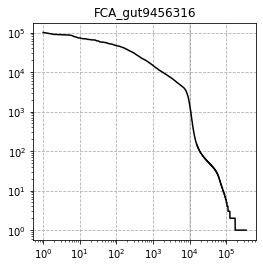

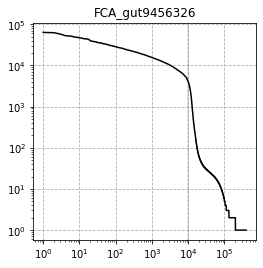

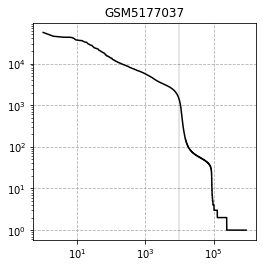

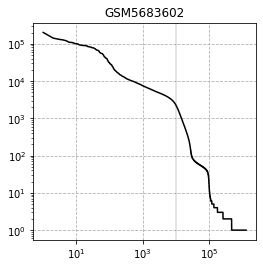

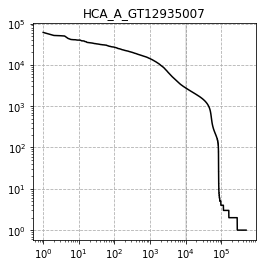

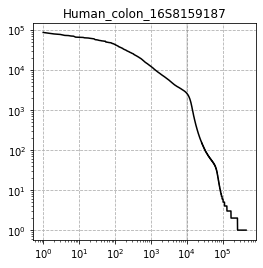

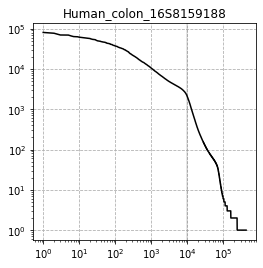

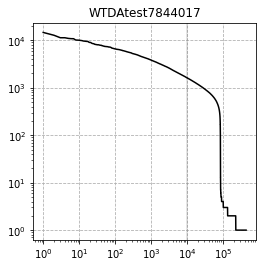

In [25]:
sk.set_figsize((4, 4))
for sid in samples_to_check1:
    nUMI = pd.read_csv(
        os.path.join(
            MAPPED_DATA_ROOT,
            healthy_metadata.loc[
                healthy_metadata.sampleID == sid, "starsolo_out"
            ].values[0],
            "Gene/UMIperCellSorted.txt",
        ),
        names=["x"],
    )["x"].values
    plt.plot(np.arange(nUMI.size) + 1, nUMI, c="k")
    plt.axvline(x=1e4, linewidth=0.2, c="k")
    plt.xscale("log")
    plt.yscale("log")
    plt.grid(linestyle="--")
    plt.title(sid)
    plt.show()

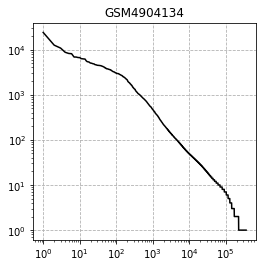

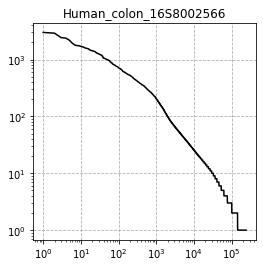

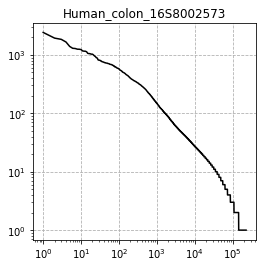

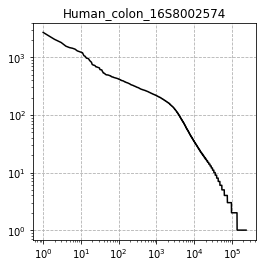

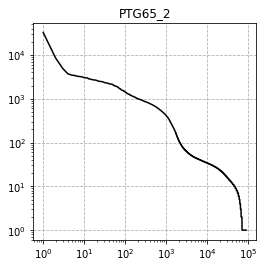

...

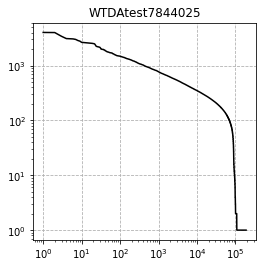

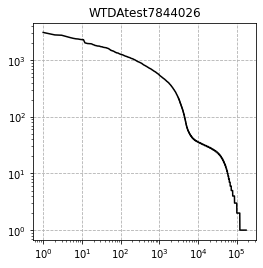

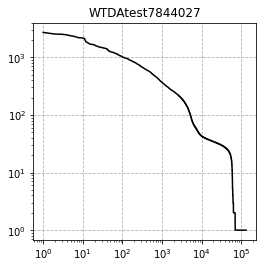

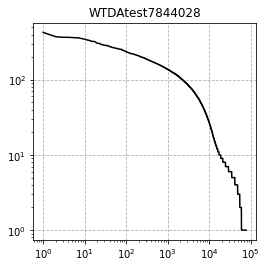

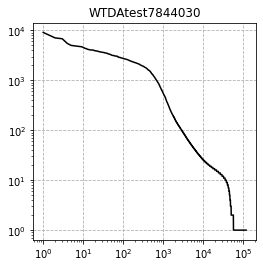

In [26]:
sk.set_figsize((4, 4))
for sid in samples_to_check2:
    nUMI = pd.read_csv(
        os.path.join(
            MAPPED_DATA_ROOT,
            healthy_metadata.loc[
                healthy_metadata.sampleID == sid, "starsolo_out"
            ].values[0],
            "Gene/UMIperCellSorted.txt",
        ),
        names=["x"],
    )["x"].values
    plt.plot(np.arange(nUMI.size) + 1, nUMI, c="k")
    plt.xscale("log")
    plt.yscale("log")
    plt.grid(linestyle="--")
    plt.title(sid)
    plt.show()

## Filter and flag doublet

In [11]:
pooled_ad0.obs.good_qc_cluster.value_counts().sort_index().values.cumsum()

array([1096161, 1248702, 1330661, 1910334])

In [12]:
pooled_ad1 = pooled_ad0[
    (pooled_ad0.obs.good_qc_cluster <= 80)
    & ~pooled_ad0.obs.sampleID.isin(samples_to_check2 + ["WTDAtest7844017"])
].copy()

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [13]:
pooled_ad1

AnnData object with n_obs × n_vars = 1313885 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [14]:
del pooled_ad0
gc.collect()

2170

In [15]:
pooled_ad1.obs.sampleID.cat.categories[0:10]

Index(['5-Int-Fresh-Unsorted', '6-Int-Fresh-Sorted', '4861STDY7135911',
       '4861STDY7135912', '4861STDY7135913', '4861STDY7135914',
       '4861STDY7135915', '4861STDY7135916', '4861STDY7135917',
       '4861STDY7135918'],
      dtype='object')

In [16]:
scr_dfs = []
for sid in pooled_ad1.obs.sampleID.cat.categories:
    scr_csv = f"scrublet/{sid}.gene_velo_cellbender.good_qc_cluster_mito80.scrublet.csv"
    if os.path.exists(scr_csv):
        scr_df = pd.read_csv(scr_csv, index_col=0)
        scr_df.index = (scr_df.index.to_series().astype(str) + f"-{sid}").values
        scr_dfs.append(scr_df)

In [17]:
scrublet_results_df = pd.concat(scr_dfs)

In [19]:
obs_df = pooled_ad1.obs.merge(
    scrublet_results_df, how="left", left_index=True, right_index=True
)

In [20]:
(obs_df.index == pooled_ad1.obs_names).all()

True

In [21]:
pooled_ad1.obs = obs_df

In [22]:
pooled_ad1.obs["doublet"] = (pooled_ad1.obs.scrublet_score > 0.3) | (
    pooled_ad1.obs.bh_pval < 0.65
)
pooled_ad1.obs["stringent_doublet"] = (pooled_ad1.obs.scrublet_score > 0.3) | (
    pooled_ad1.obs.bh_pval < 0.05
)

In [23]:
pooled_ad1.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.doublet_flagged.20220909.h5ad",
    compression="gzip",
)

## Integration

In [13]:
arches_params = dict(
    n_layers=2,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
)

In [14]:
pooled_ad1 = sc.read(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.doublet_flagged.20220909.h5ad"
)

In [15]:
pooled_ad1 = pooled_ad1[~pooled_ad1.obs.stringent_doublet].copy()

In [16]:
gc.collect()

2284

In [17]:
pooled_ad1

AnnData object with n_obs × n_vars = 1246039 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_s

In [18]:
pooled_ad1.raw = pooled_ad1
pooled_ad1 = pooled_ad1[:, ~pooled_ad1.var["cc"]].copy()
gc.collect()

148

In [19]:
sc.pp.highly_variable_genes(
    pooled_ad1,
    flavor="seurat_v3",
    n_top_genes=7500,
    subset=True,
)

In [21]:
scvi.model.SCVI.setup_anndata(
    pooled_ad1,
    batch_key="donorID_unified",
    # categorical_covariate_keys=["study"],
    continuous_covariate_keys=["log1p_n_counts", "percent_mito"],
)

vae = scvi.model.SCVI(pooled_ad1, n_latent=20, **arches_params)

vae.train(
    train_size=0.9,
    early_stopping_patience=45,
    max_epochs=400,
    batch_size=256,
    limit_train_batches=100,
    use_gpu=True,
)
joblib.dump(
    vae,
    f"model/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_vae.20220930.pkl",
)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Epoch 400/400: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [12:30<00:00,  1.88s/it, loss=821, v_num=1]


['model/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_vae.20220930.pkl']

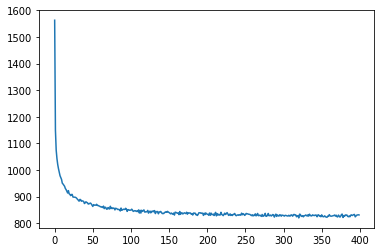

In [22]:
plt.plot(vae.history["elbo_train"])

In [23]:
pooled_ad1.obsm["X_scvi"] = vae.get_latent_representation()

In [27]:
mde_obj = run_mde(pooled_ad1.obsm["X_scvi"])

# conn, dist = mde_neighbors(mde_obj, pooled_ad1.n_obs)

# ad1.obsp["mde_connectivities"] = conn
# ad1.obsp["mde_distances"] = dist

# ad1.uns["neighbors_mde"] = {
#     "method": "mde",
#     "params": {"n_neighbors": 15},
#     "random_state": 0,
#     "use_rep": "X_scvi",
#     "connectivities_key": "mde_connectivities",
#     "distances_key": "mde_distances",
# }

pooled_ad1.obsm["X_mde"] = mde_embed(mde_obj)

sc.pp.neighbors(pooled_ad1, use_rep="X_scvi")

# sc.tl.umap(pooled_ad1, min_dist=0.3)

aux_ad = anndata.AnnData(
    X=pooled_ad1.raw.X,
    obs=pooled_ad1.obs,
    var=pooled_ad1.raw.var,
    obsm=pooled_ad1.obsm,
    obsp=pooled_ad1.obsp,
    uns=pooled_ad1.uns,
)
del pooled_ad1

aux_ad.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.20220930.h5ad",
    compression="gzip",
)
del aux_ad
gc.collect()

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/torch/_lobpcg.py:946: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755903507/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1672.)
  Rinv = torch.triangular_solve(Id, R, upper=True).solution


59170

In [7]:
annot_df = pd.concat(
    [
        pd.read_csv("annotation/broad_annotation.fetal.20220914.csv.gz", index_col=0),
        pd.read_csv(
            "annotation/broad_annotation.non-fetal.20220914.csv.gz", index_col=0
        ),
    ]
)

In [8]:
annot_df.head()

,broad_annot_20220914
index,
AAACCTGAGCGTCTAT-4918STDY7317585,Mes
AAACCTGCACAAGTAA-4918STDY7317585,Mes
AAACCTGCACCCATGG-4918STDY7317585,Mes
AAACCTGCATGGGACA-4918STDY7317585,Mes
AAACCTGGTGTGCGTC-4918STDY7317585,Neural


In [9]:
pooled_ad1 = sc.read(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.20220930.h5ad"
)

In [10]:
obs_df = pooled_ad1.obs.merge(annot_df, how="left", left_index=True, right_index=True)

In [11]:
(obs_df.index == pooled_ad1.obs_names).all()

True

In [12]:
pooled_ad1.obs = obs_df

In [15]:
martin19_lr = joblib.load("model/martin19_all.lognorm.pkl")
warner20_lr = joblib.load("model/warner20final_lognorm.pkl")

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 1.1.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [13]:
tmp_ad = anndata.AnnData(
    X=pooled_ad1.X, obs=pooled_ad1.obs[["sampleID"]], var=pooled_ad1.var
)
sc.pp.normalize_total(tmp_ad, target_sum=1e4)
sc.pp.log1p(tmp_ad)

In [16]:
sk.LR_predict(tmp_ad, martin19_lr, use_rep="X", key_added="martin19_pred")
sk.LR_predict(tmp_ad, warner20_lr, use_rep="X", key_added="warner20_pred")
for src in ("martin19", "warner20"):
    pooled_ad1.obs[f"{src}_pred"] = tmp_ad.obs[f"{src}_pred"]
    pooled_ad1.obs[f"{src}_pred_prob"] = tmp_ad.obs[f"{src}_pred_prob"]
    pooled_ad1.obs[f"{src}_pred_uncertain"] = pooled_ad1.obs[f"{src}_pred"].astype(str)
    pooled_ad1.obs.loc[
        tmp_ad.obs[f"{src}_pred_prob"] < 0.3, f"{src}_pred_uncertain"
    ] = "Uncertain"
    pooled_ad1.obs[f"{src}_pred_uncertain"] = pooled_ad1.obs[
        f"{src}_pred_uncertain"
    ].astype("category")
del tmp_ad
gc.collect()

21934 features used for prediction
21820 features used for prediction


8354

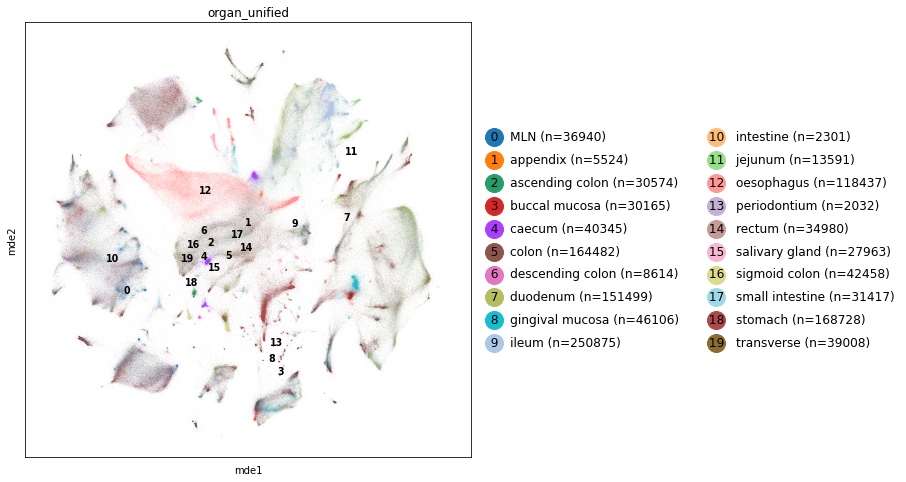

In [23]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="organ_unified",
    annot="full",
    figsize=(8, 8),
);

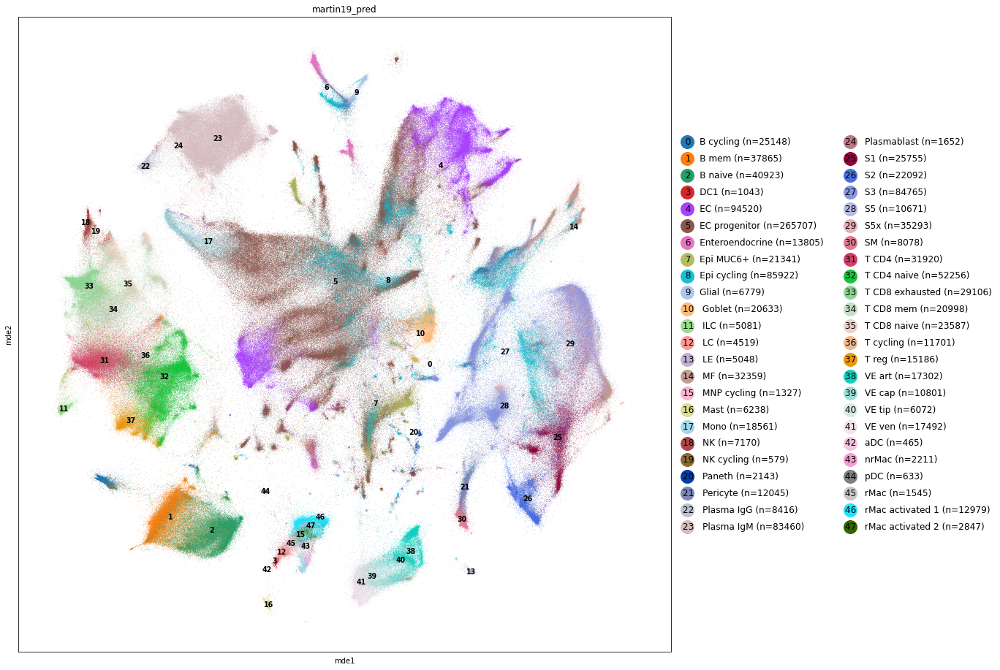

In [7]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="martin19_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

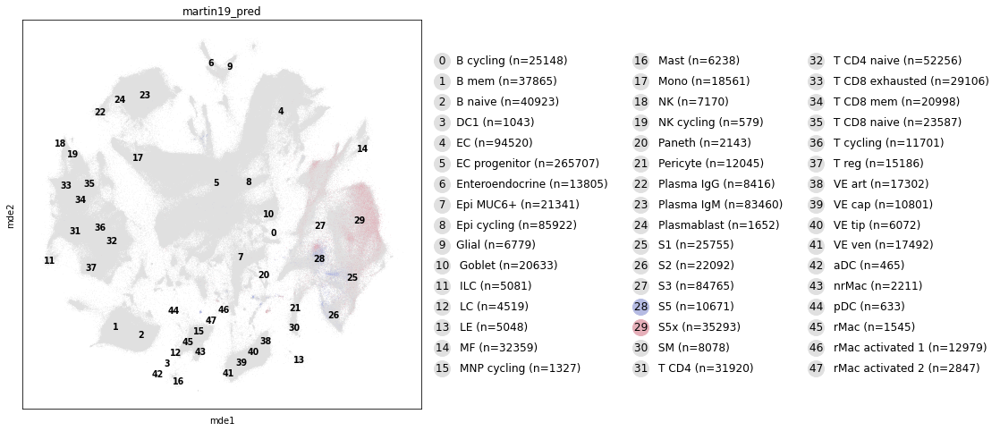

In [9]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="martin19_pred",
    annot="full",
    figsize=(8, 8),
    highlight_group=["S5", "S5x"],
    use_uns_colors=False,
    size=1,
);

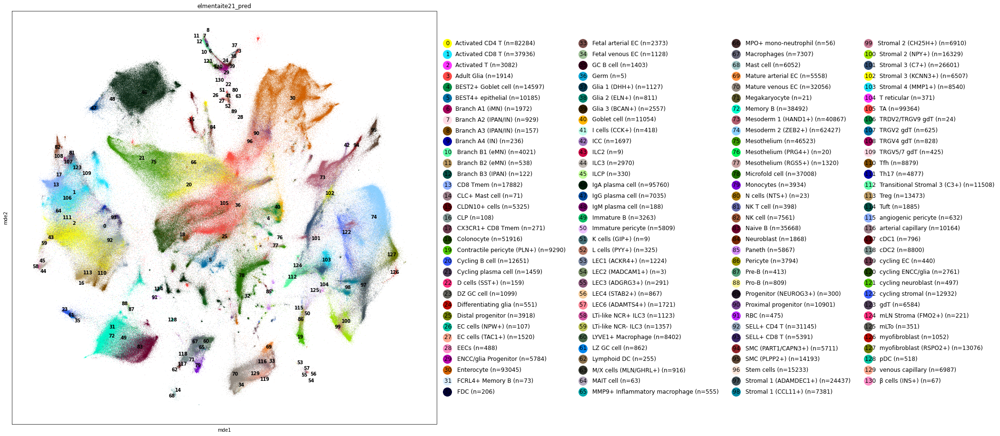

In [26]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="elmentaite21_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

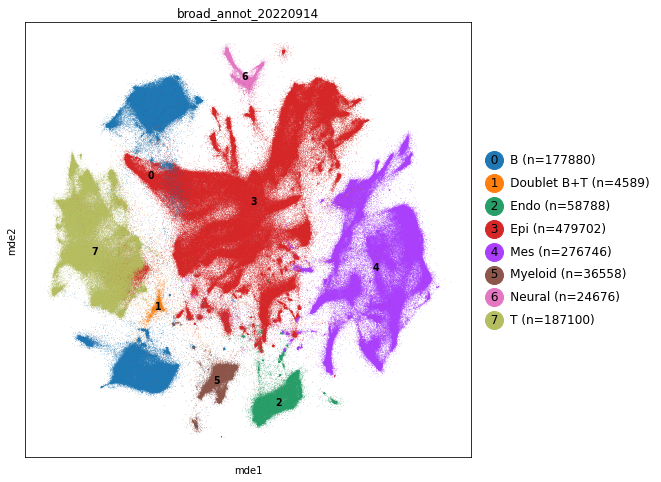

In [17]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="broad_annot_20220914",
    annot="full",
    figsize=(8, 8),
    size=1,
);

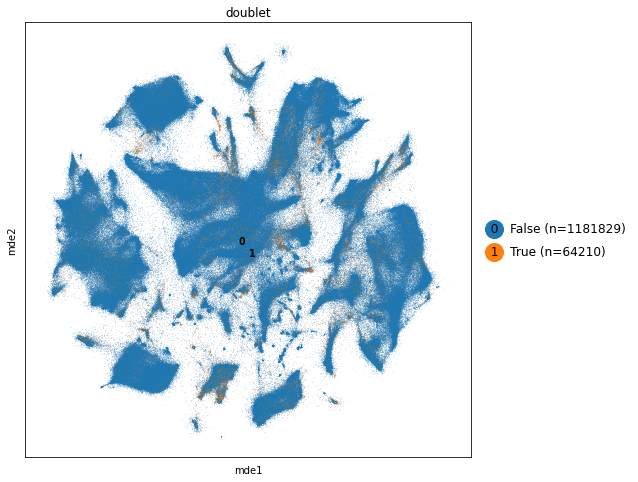

In [19]:
sk.plot_embedding(
    pooled_ad1,
    basis="mde",
    groupby="doublet",
    annot="full",
    figsize=(8, 8),
    size=1,
);

In [20]:
sk.clear_colors(pooled_ad1)
pooled_ad1.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.with_broad_annotation.20220930.h5ad",
    compression="gzip",
)

In [4]:
pooled_ad1 = sc.read(
    "h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.with_broad_annotation.20220930.h5ad",
    backed="r",
)

================= THE END ====================

### Separate fetal non-fetal

In [13]:
pooled_ad1.obs["integration_grouping"] = sk.regroup(
    pooled_ad1,
    groupby="donor_category",
    regroups={
        "fetal": ["inutero", "preterm"],
        "non-fetal": ["control"],
    },
)

In [17]:
pooled_ad1.obs.donor_category.value_counts()

control    889048
inutero    346576
preterm     10415
Name: donor_category, dtype: int64

In [18]:
pooled_ad1s = sk.split_by_group(pooled_ad1, groupby="integration_grouping")

In [19]:
del pooled_ad1
gc.collect()

252

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]


Epoch 400/400: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [10:08<00:00,  1.52s/it, loss=1.48e+03, v_num=1]


/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/torch/_lobpcg.py:946: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755903507/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1672.)
  Rinv = torch.triangular_solve(Id, R, upper=True).solution
/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU 

Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [10:59<00:00,  1.65s/it, loss=690, v_num=1]


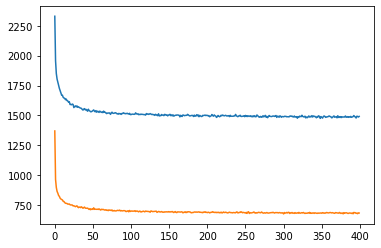

In [20]:
for name, ad1 in pooled_ad1s.items():
    ad1.raw = ad1
    ad1 = ad1[:, ~ad1.var["cc"]].copy()

    sc.pp.highly_variable_genes(
        ad1,
        flavor="seurat_v3",
        n_top_genes=7500,
        subset=True,
    )

    scvi.model.SCVI.setup_anndata(
        ad1,
        batch_key="donorID_unified",
        categorical_covariate_keys=["study"],
        continuous_covariate_keys=["log1p_n_counts", "percent_mito"],
    )

    vae = scvi.model.SCVI(ad1, n_latent=20, **arches_params)

    vae.train(
        train_size=0.9,
        early_stopping_patience=45,
        max_epochs=400,
        batch_size=256,
        limit_train_batches=100,
        use_gpu=True,
    )
    joblib.dump(
        vae,
        f"model/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.{name}.hvg7500_noCC.scvi_vae.pkl",
    )

    plt.plot(vae.history["elbo_train"])

    ad1.obsm["X_scvi"] = vae.get_latent_representation()

    mde_obj = run_mde(ad1.obsm["X_scvi"])

    conn, dist = mde_neighbors(mde_obj, ad1.n_obs)

    ad1.obsp["mde_connectivities"] = conn
    ad1.obsp["mde_distances"] = dist

    ad1.uns["neighbors_mde"] = {
        "method": "mde",
        "params": {"n_neighbors": 15},
        "random_state": 0,
        "use_rep": "X_scvi",
        "connectivities_key": "mde_connectivities",
        "distances_key": "mde_distances",
    }

    ad1.obsm["X_mde"] = mde_embed(mde_obj)

    sc.pp.neighbors(ad1, use_rep="X_scvi")

    sc.tl.umap(ad1, min_dist=0.3)

    aux_ad = anndata.AnnData(
        X=ad1.raw.X,
        obs=ad1.obs,
        var=ad1.raw.var,
        obsm=ad1.obsm,
        obsp=ad1.obsp,
        uns=ad1.uns,
    )
    del ad1

    aux_ad.write(
        f"h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.{name}.hvg7500_noCC.scvi_output.lv20_batch256.h5ad",
        compression="gzip",
    )
    del aux_ad
    gc.collect()

## Clustering / broad annotation

In [11]:
aux_ads = {
    name: sc.read(
        f"h5ad/pooled/pooled_healthy.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.{name}.hvg7500_noCC.scvi_output.lv20_batch256.h5ad"
    )
    for name in ("fetal", "non-fetal")
}

In [13]:
for name, ad in aux_ads.items():
    tmp_ad = anndata.AnnData(X=ad.X, obs=ad.obs[["sampleID"]], var=ad.var)
    sc.pp.normalize_total(tmp_ad, target_sum=1e4)
    sc.pp.log1p(tmp_ad)
    sk.LR_predict(tmp_ad, martin19_lr, use_rep="X", key_added="martin19_pred")
    sk.LR_predict(tmp_ad, warner20_lr, use_rep="X", key_added="warner20_pred")
    for src in ("martin19", "warner20"):
        ad.obs[f"{src}_pred"] = tmp_ad.obs[f"{src}_pred"]
        ad.obs[f"{src}_pred_prob"] = tmp_ad.obs[f"{src}_pred_prob"]
        ad.obs[f"{src}_pred_uncertain"] = ad.obs[f"{src}_pred"].astype(str)
        ad.obs.loc[
            tmp_ad.obs[f"{src}_pred_prob"] < 0.3, f"{src}_pred_uncertain"
        ] = "Uncertain"
        ad.obs[f"{src}_pred_uncertain"] = ad.obs[f"{src}_pred_uncertain"].astype(
            "category"
        )
    del tmp_ad
    gc.collect()

21934 features used for prediction
21820 features used for prediction
21934 features used for prediction
21820 features used for prediction


In [14]:
aux_ads

{'fetal': AnnData object with n_obs × n_vars = 356991 × 36601
     obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_c

In [15]:
prev_annot = pd.read_csv(
    "annotation/pooled_healthy.gene_cellbender.qc_filtered.no_doublet.annotation.20220620.csv",
    index_col=0,
)

In [16]:
prev_annot.head()

,annot_20220620
index,
AAACCTGAGTTCGCAT-4918STDY7274839,Colon_apopt-PCdoublet
AAACCTGCAACACCCG-4918STDY7274839,Th17
AAACCTGTCATGGTCA-4918STDY7274839,Macrophage
AAACCTGTCCTTGCCA-4918STDY7274839,CD8+Trm.cytotox-high
AAACGGGAGATCGGGT-4918STDY7274839,CD8+Trm


In [17]:
for name, ad in aux_ads.items():
    rapids_leiden(
        ad, neighbors_key="neighbors", resolution=0.1, key_added="leiden_scvi_r0_1"
    )
    ad.obs["annot_20220620"] = "nan"
    ad.obs["annot_20220620"].update(prev_annot.annot_20220620)

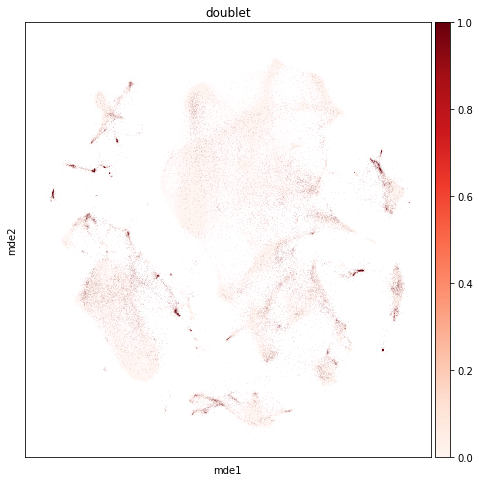

In [38]:
sk.set_figsize((8, 8))
sc.pl.embedding(aux_ads["fetal"], basis="mde", color="doublet", cmap="Reds");

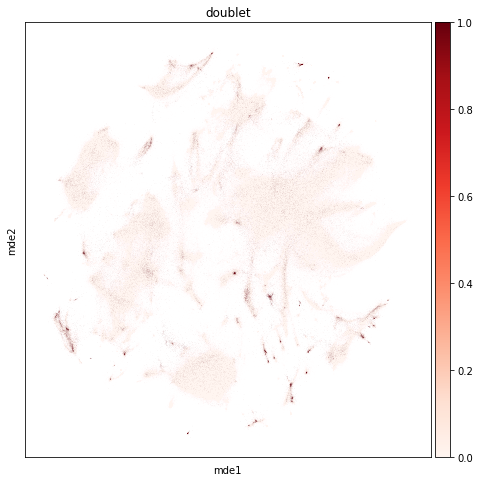

In [52]:
sk.set_figsize((8, 8))
sc.pl.embedding(aux_ads["non-fetal"], basis="mde", color="doublet", cmap="Reds");

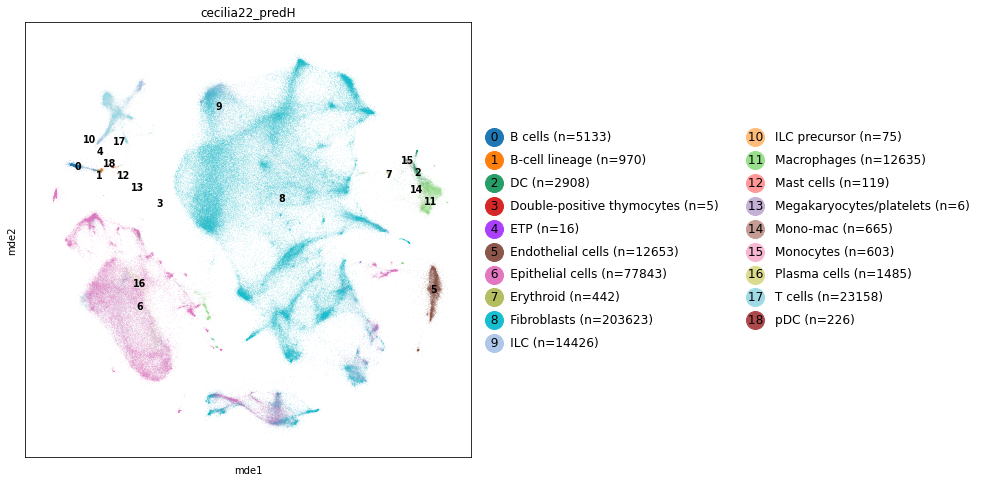

In [27]:
sk.plot_embedding(
    aux_ads["fetal"],
    basis="mde",
    groupby="cecilia22_predH",
    annot="full",
    figsize=(8, 8),
);

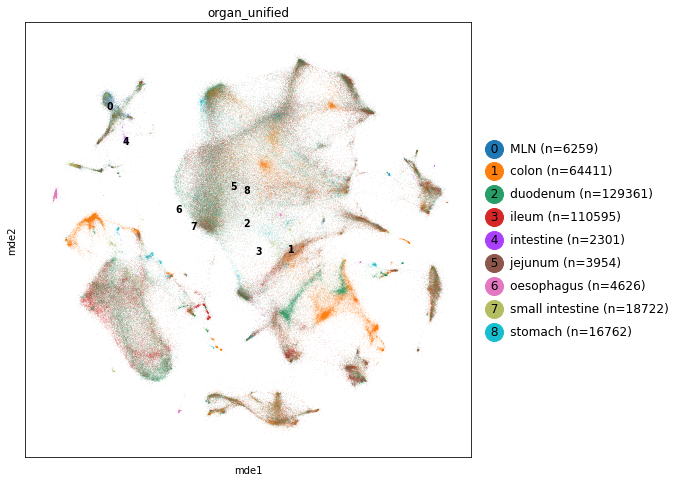

In [42]:
sk.plot_embedding(
    aux_ads["fetal"], basis="mde", groupby="organ_unified", annot="full", figsize=(8, 8)
);

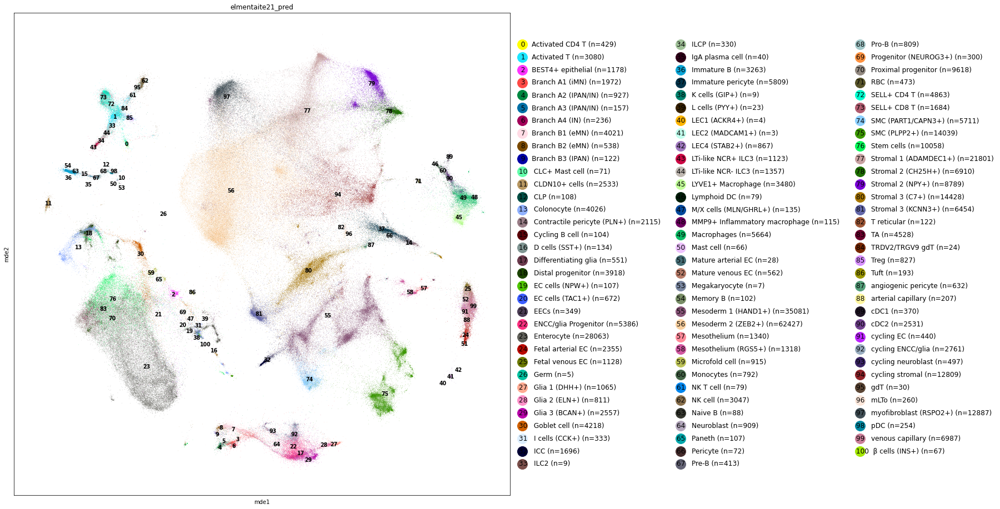

In [37]:
sk.plot_embedding(
    aux_ads["fetal"],
    basis="mde",
    groupby="elmentaite21_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


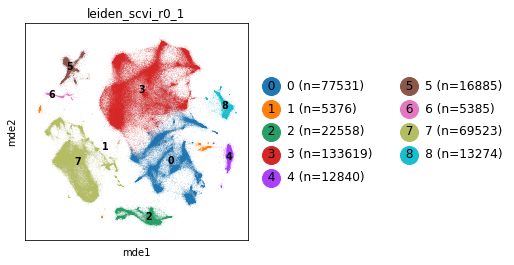

In [24]:
sk.plot_embedding(
    aux_ads["fetal"],
    basis="mde",
    groupby="leiden_scvi_r0_1",
    annot="full",
    figsize=(4, 4),
);

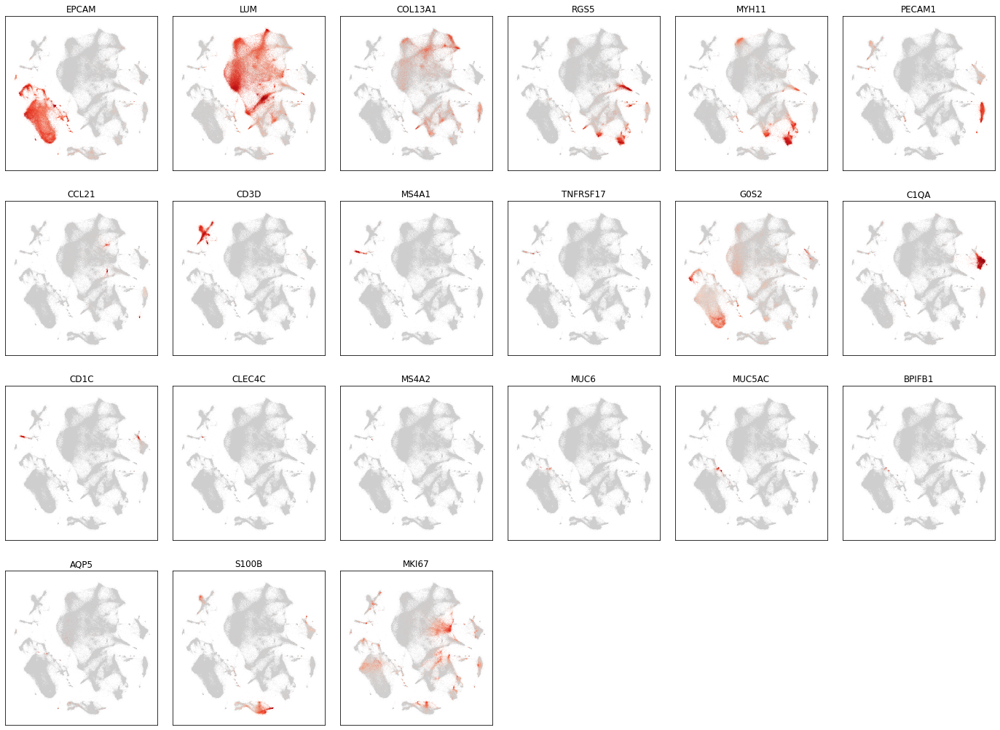

In [189]:
sk.plot_genes(
    aux_ads["fetal"],
    broad_markers,
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

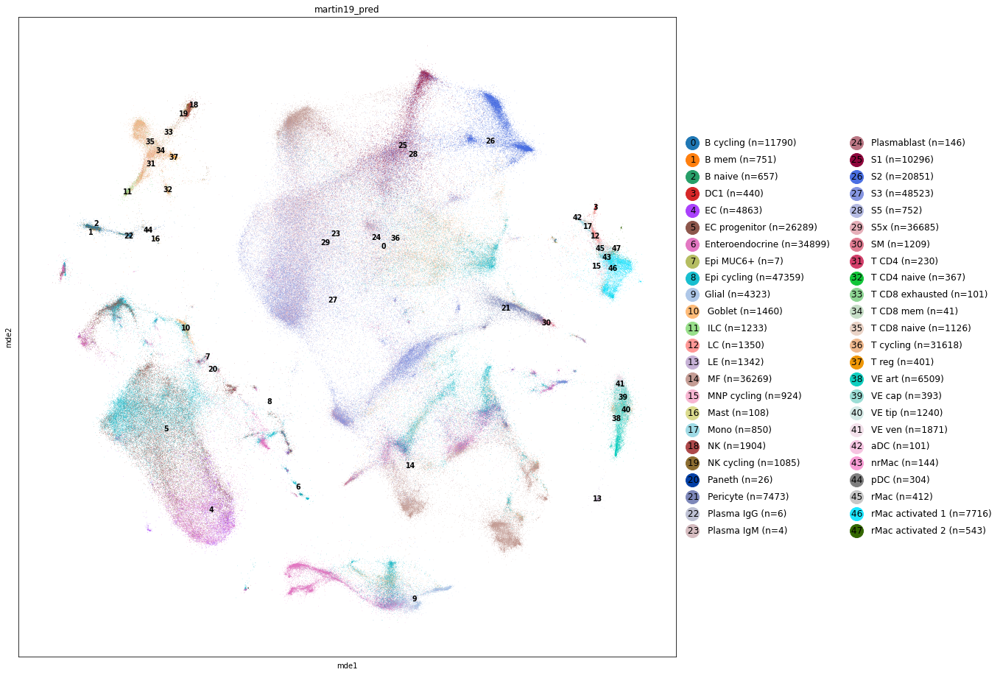

In [56]:
sk.plot_embedding(
    aux_ads["fetal"],
    basis="mde",
    groupby="martin19_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

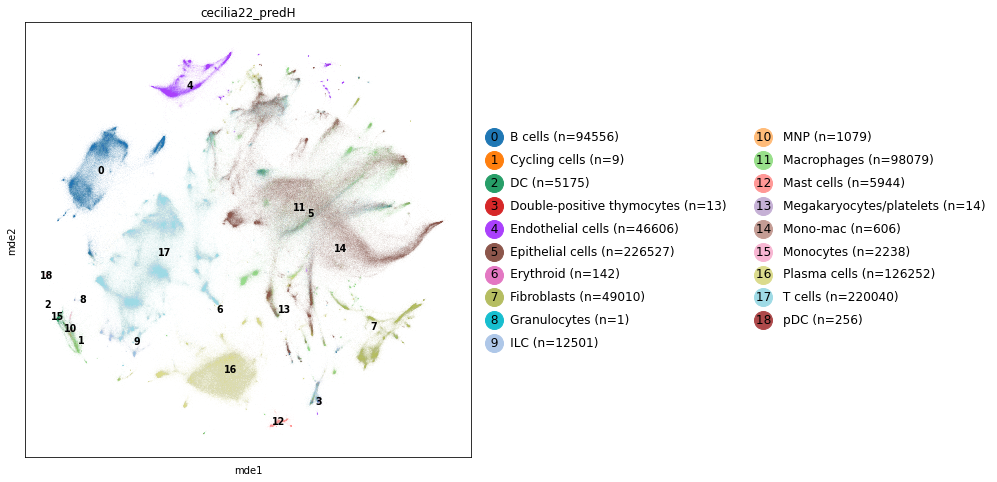

In [28]:
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="cecilia22_predH",
    annot="full",
    figsize=(8, 8),
);

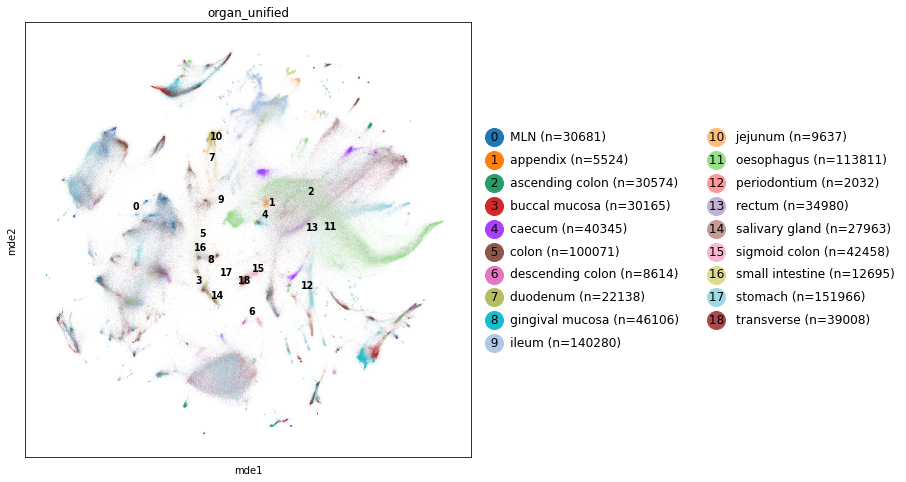

In [40]:
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="organ_unified",
    annot="full",
    figsize=(8, 8),
);

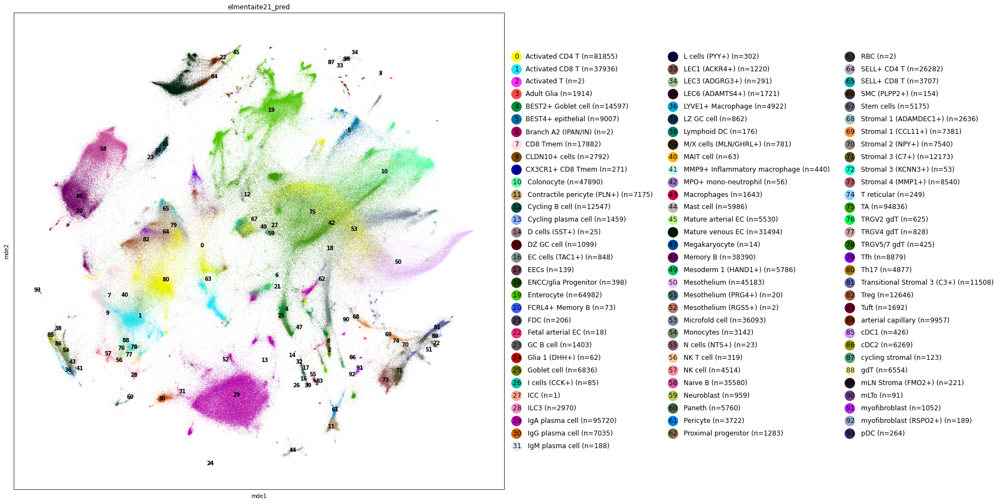

In [29]:
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="elmentaite21_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

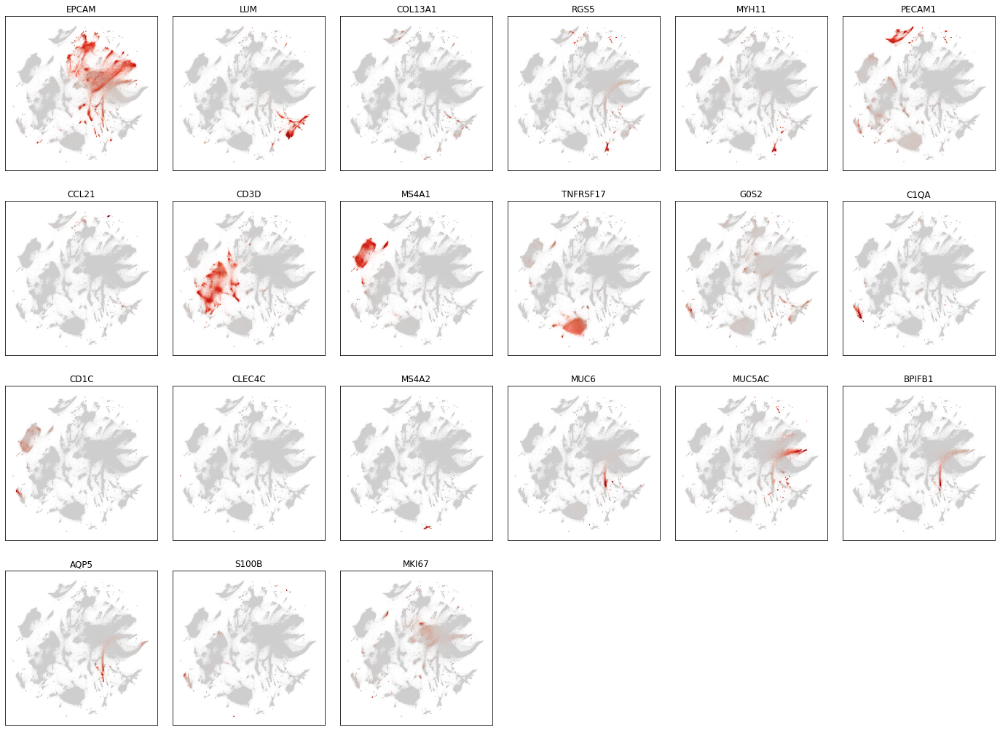

In [175]:
sk.plot_genes(
    aux_ads["non-fetal"],
    broad_markers,
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

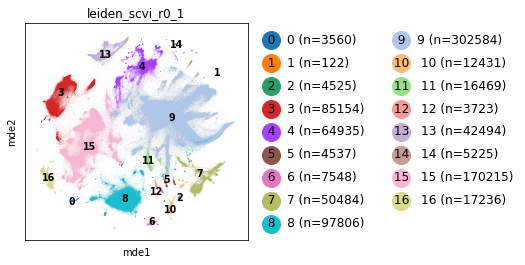

In [57]:
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_r0_1",
    annot="full",
    figsize=(4, 4),
);

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


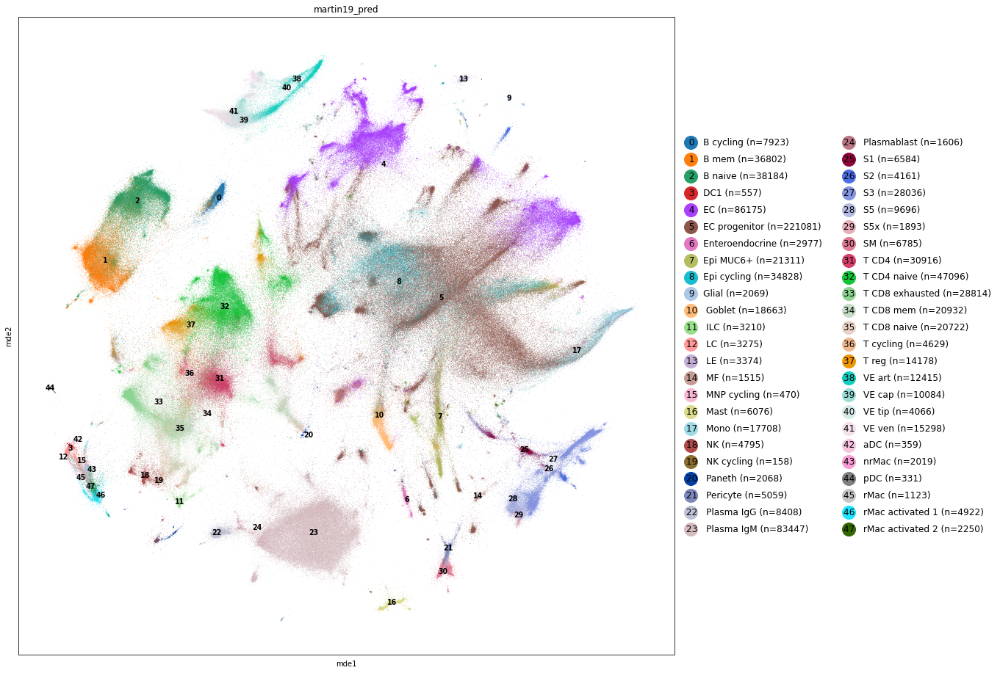

In [55]:
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="martin19_pred",
    annot="full",
    figsize=(16, 16),
    size=1,
);

### Fetal

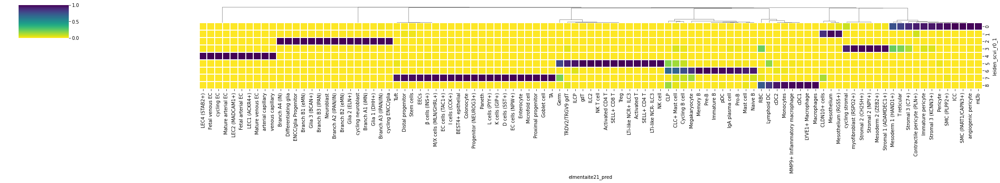

In [37]:
sk.heatmap(
    sk.cross_table(
        aux_ads["fetal"], "leiden_scvi_r0_1", "elmentaite21_pred", normalise="y"
    ),
    cmap="viridis_r",
    figsize=(30, aux_ads["fetal"].obs[cluster].cat.categories.size / 3 + 2.5),
    cluster=True,
    row_cluster=False,
)

In [164]:
rapids_leiden(
    aux_ads["fetal"],
    neighbors_key="neighbors",
    resolution=0.1,
    restrict_to=("leiden_scvi_r0_1", ["1"]),
    key_added="leiden_scvi_split1",
)

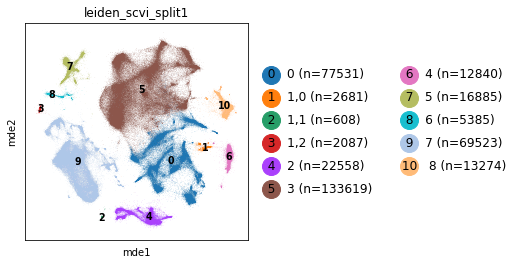

In [165]:
sk.plot_embedding(
    aux_ads["fetal"],
    basis="mde",
    groupby="leiden_scvi_split1",
    annot="full",
    figsize=(4, 4),
);

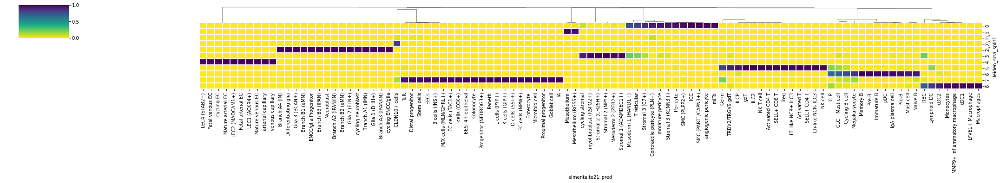

In [38]:
sk.heatmap(
    sk.cross_table(
        aux_ads["fetal"], "leiden_scvi_split1", "elmentaite21_pred", normalise="y"
    ),
    cmap="viridis_r",
    figsize=(30, aux_ads["fetal"].obs[cluster].cat.categories.size / 3 + 2.5),
    cluster=True,
    row_cluster=False,
)

In [166]:
aux_ads["fetal"].obs["broad_annot_20220914"] = sk.regroup(
    aux_ads["fetal"],
    groupby="leiden_scvi_split1",
    regroups={
        "Epi": ["1,1", "1,2", "7"],
        "Endo": ["4"],
        "Mes": ["0", "1,0", "3"],
        "Neural": ["2"],
        "B": ["6"],
        "T": ["5"],
        "Myeloid": ["8"],
    },
)

In [194]:
aux_ads["fetal"].obs["broad_annot_20220914"].to_csv(
    "annotation/broad_annotation.fetal.20220914.csv.gz"
)

### Non-fetal

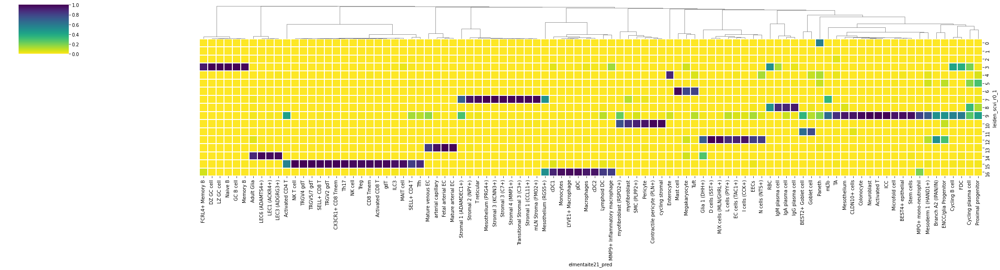

In [40]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"], "leiden_scvi_r0_1", "elmentaite21_pred", normalise="y"
    ),
    cmap="viridis_r",
    figsize=(30, aux_ads["non-fetal"].obs[cluster].cat.categories.size / 3 + 2.5),
    cluster=True,
    row_cluster=False,
)

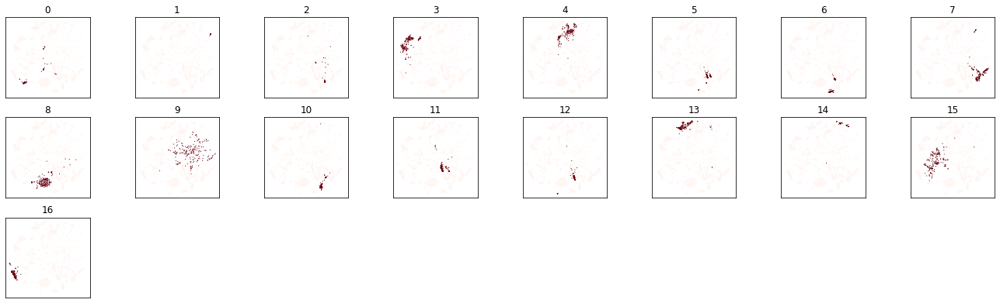

In [58]:
sk.highlight(
    ds_aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_r0_1",
    figsize=(2, 2),
    size=5,
    ncols=8,
);

In [49]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_r0_1", ["14"]),
    key_added="leiden_scvi_split1",
)

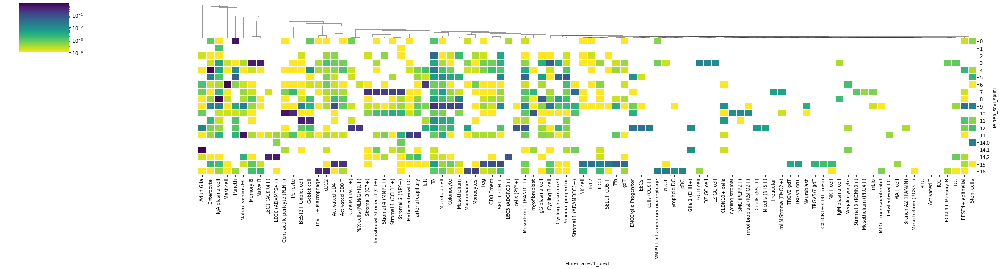

In [60]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split1",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(30, aux_ads["non-fetal"].obs[cluster].cat.categories.size / 3 + 2.5),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

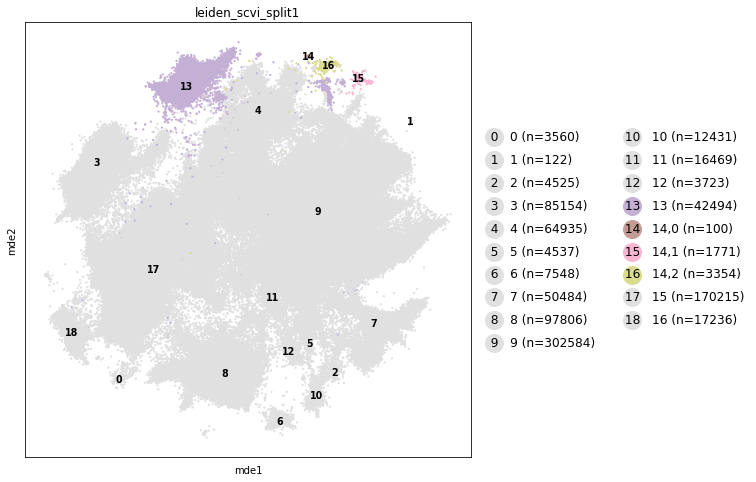

In [66]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split1",
    annot="full",
    highlight_group=["13", "14,0", "14,1", "14,2"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=20,
);

In [67]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split1", ["12"]),
    key_added="leiden_scvi_split2",
)

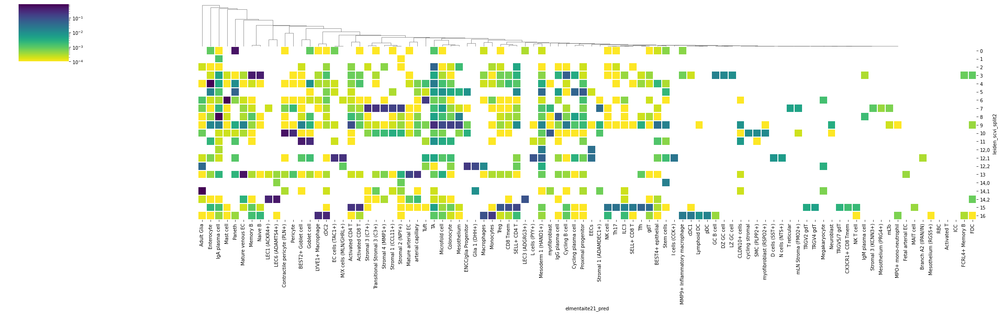

In [69]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split2",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split2"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

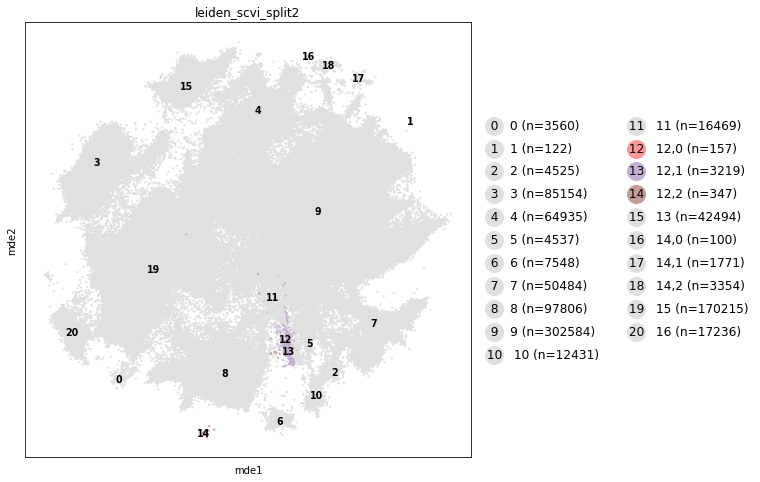

In [70]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split2",
    annot="full",
    highlight_group=["12,0", "12,1", "12,2"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=20,
);

In [87]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split2", ["8"]),
    key_added="leiden_scvi_split3",
)

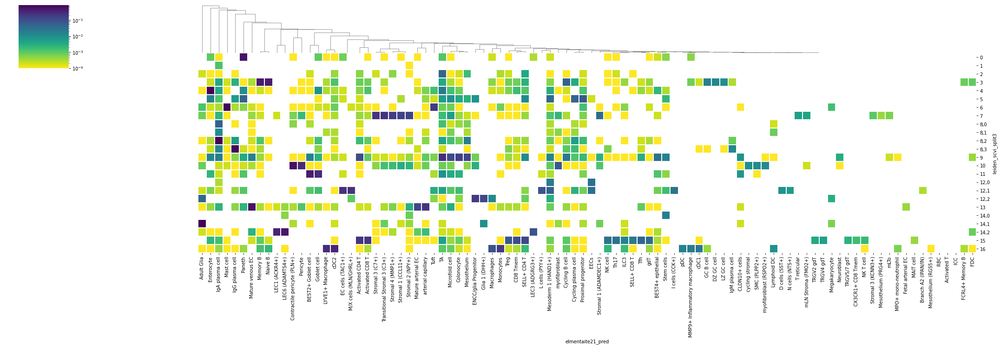

In [88]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split3",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split3"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

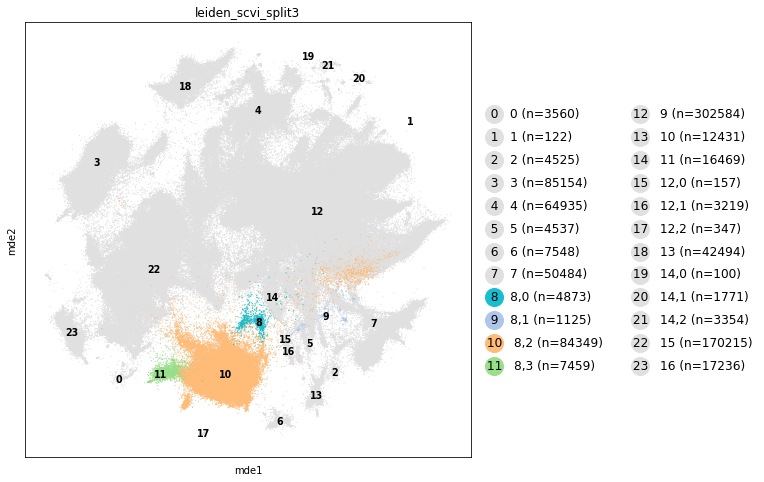

In [89]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split3",
    annot="full",
    highlight_group=["8,0", "8,1", "8,2", "8,3"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=5,
);

In [91]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split3", ["6"]),
    key_added="leiden_scvi_split4",
)

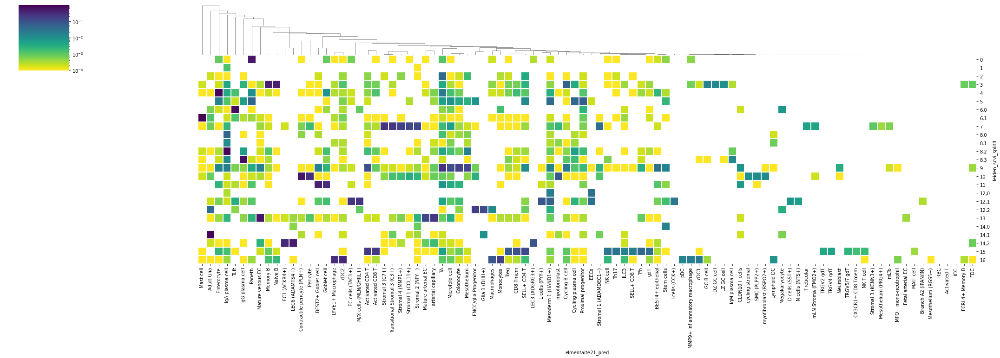

In [92]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split4",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split4"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

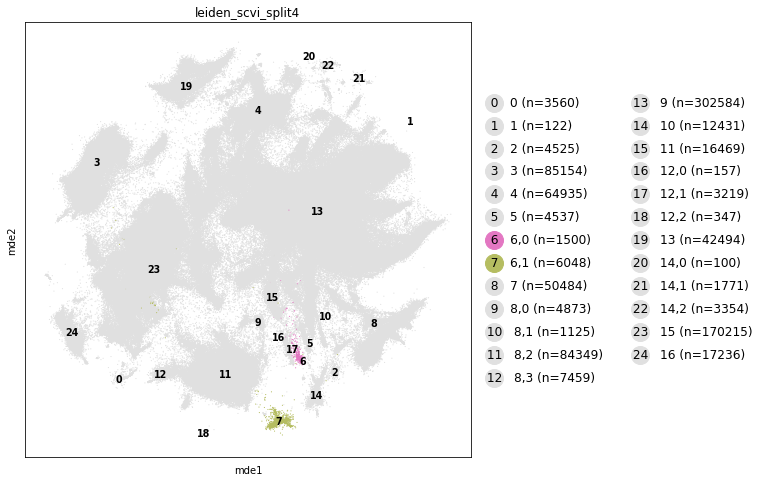

In [95]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split4",
    annot="full",
    highlight_group=["6,0", "6,1"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=5,
);

In [100]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split4", ["5"]),
    key_added="leiden_scvi_split5",
)

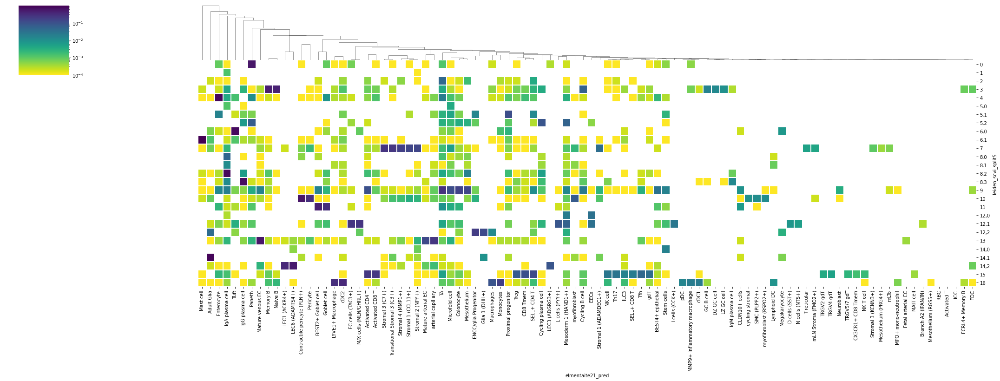

In [101]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split5",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split5"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

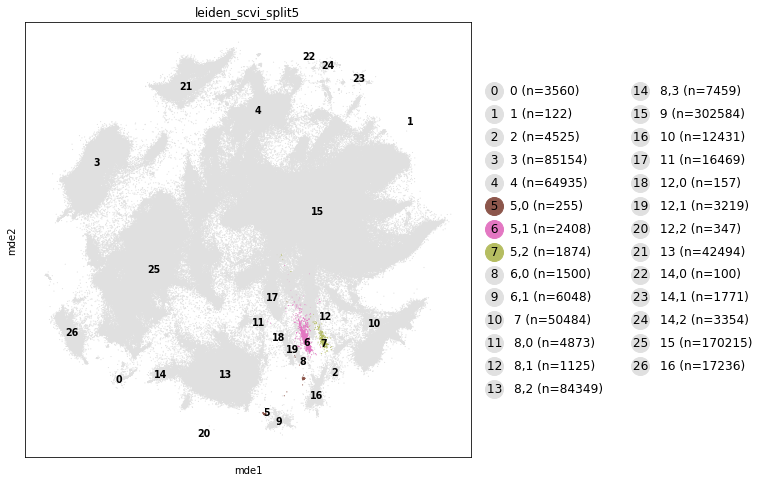

In [103]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split5",
    annot="full",
    highlight_group=["5,0", "5,1", "5,2"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=5,
);

In [123]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split5", ["3"]),
    key_added="leiden_scvi_split6",
)

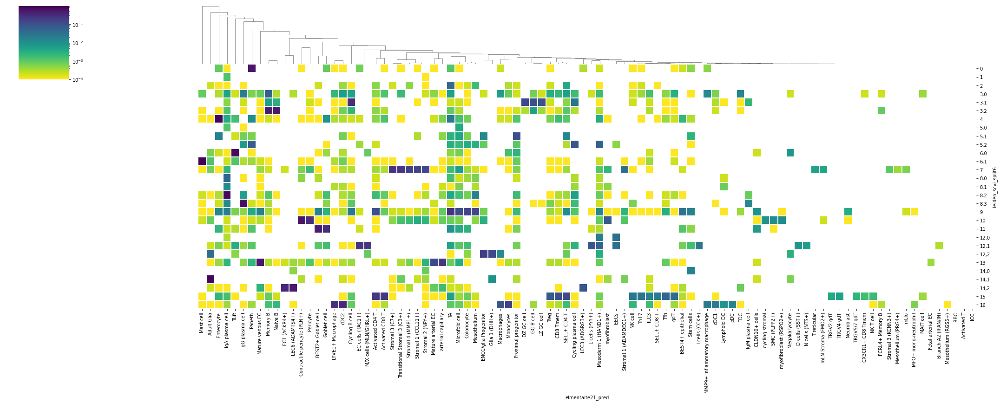

In [124]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split6",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split6"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

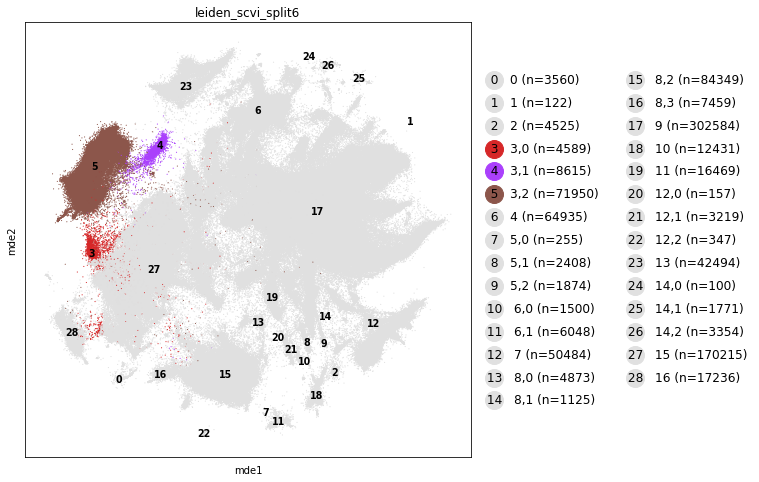

In [125]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split6",
    annot="full",
    highlight_group=["3,0", "3,1", "3,2"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=5,
);

In [148]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split6", ["7"]),
    key_added="leiden_scvi_split7a",
)

In [149]:
rapids_leiden(
    aux_ads["non-fetal"],
    neighbors_key="neighbors",
    resolution=0.05,
    restrict_to=("leiden_scvi_split7a", ["7,0"]),
    key_added="leiden_scvi_split7",
)

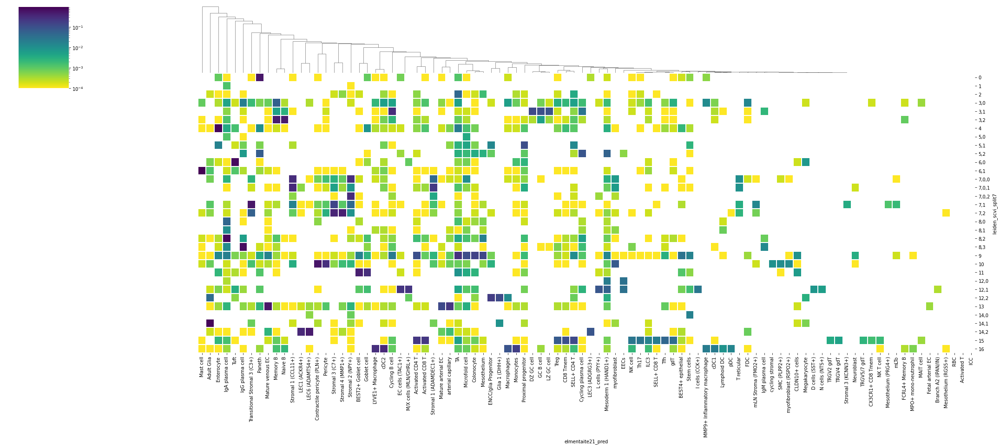

In [150]:
sk.heatmap(
    sk.cross_table(
        aux_ads["non-fetal"],
        "leiden_scvi_split7",
        "elmentaite21_pred",
        normalise="jaccard",
    ),
    cmap="viridis_r",
    figsize=(
        30,
        aux_ads["non-fetal"].obs["leiden_scvi_split7"].cat.categories.size / 3 + 2.5,
    ),
    cluster=True,
    row_cluster=False,
    vmin=0,
    vmax=1,
    norm=LogNorm(),
)

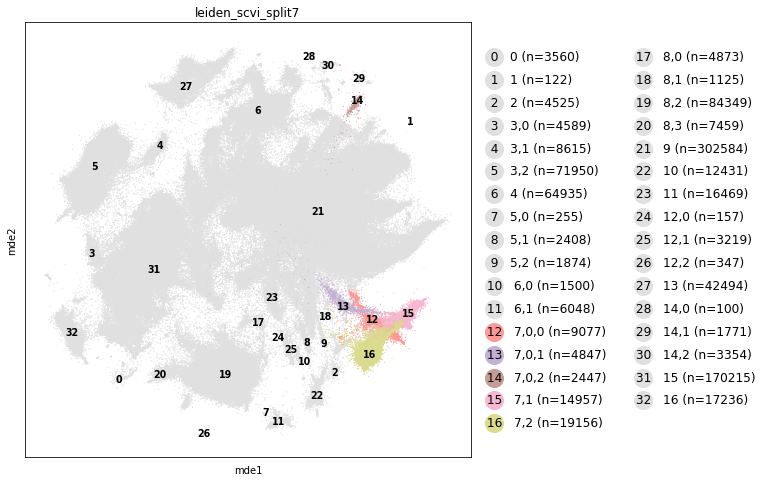

In [151]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="leiden_scvi_split7",
    annot="full",
    highlight_group=["7,0,0", "7,0,1", "7,0,2", "7,1", "7,2"],
    use_uns_colors=False,
    figsize=(8, 8),
    size=5,
);

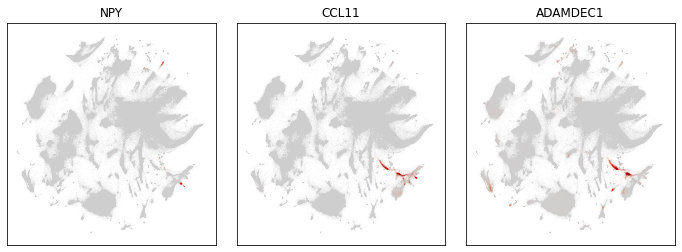

In [152]:
sk.plot_genes(
    aux_ads["non-fetal"],
    ["NPY", "CCL11", "ADAMDEC1"],
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

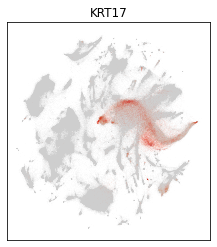

In [178]:
sk.plot_genes(
    aux_ads["non-fetal"],
    ["KRT17"],
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

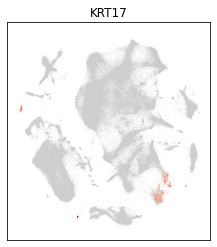

In [179]:
sk.plot_genes(
    aux_ads["fetal"],
    ["KRT17"],
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

In [180]:
aux_ads["non-fetal"].obs["krt17_gt0"] = aux_ads["non-fetal"].obs_vector("KRT17") > 0

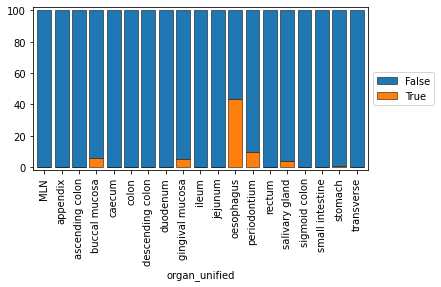

In [188]:
sk.set_figsize((6, 3))
sk._plot.plot_composition(
    aux_ads["non-fetal"], "krt17_gt0", "organ_unified", "sampleID"
);

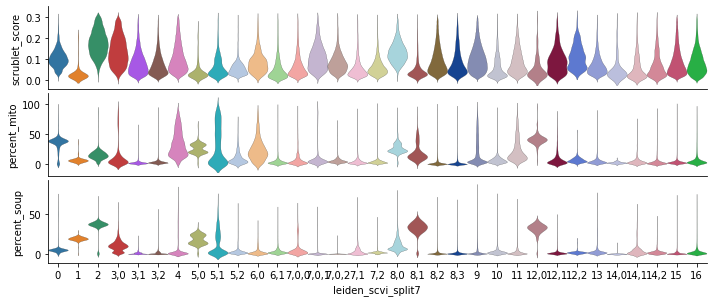

In [154]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_qc_violin(
    aux_ads["non-fetal"],
    metrics=["scrublet_score", "percent_mito", "percent_soup"],
    groupby="leiden_scvi_split7",
    one_per_line=True,
    stripplot=False,
    figsize=(10, 1.5),
    scale="width",
)

In [173]:
broad_markers = [
    "EPCAM",
    "LUM",
    "COL13A1",
    "RGS5",
    "MYH11",
    "PECAM1",
    "CCL21",
    "CD3D",
    "MS4A1",
    "TNFRSF17",
    "G0S2",
    "C1QA",
    "CD1C",
    "CLEC4C",
    "MS4A2",
    "MUC6",
    "MUC5AC",
    "BPIFB1",
    "AQP5",
    "S100B",
    "MKI67",
]

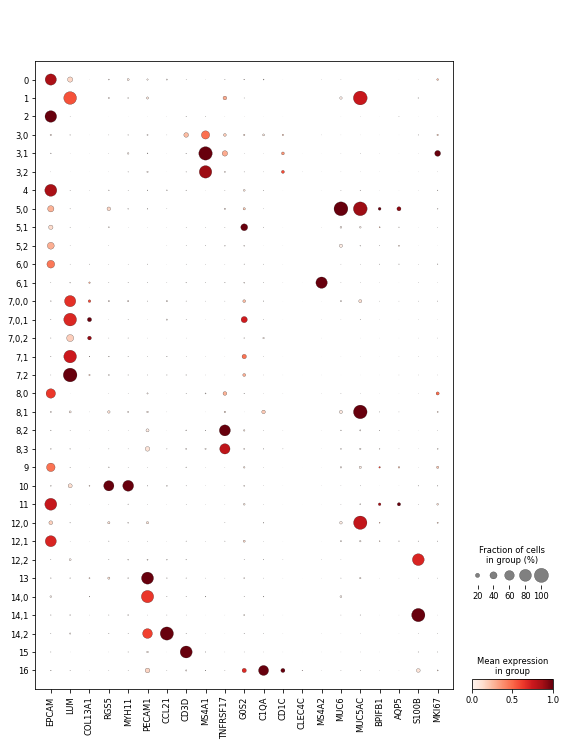

In [174]:
sc.pl.dotplot(
    aux_ads["non-fetal"],
    broad_markers,
    groupby="leiden_scvi_split7",
    standard_scale="var",
)

broad cell markers

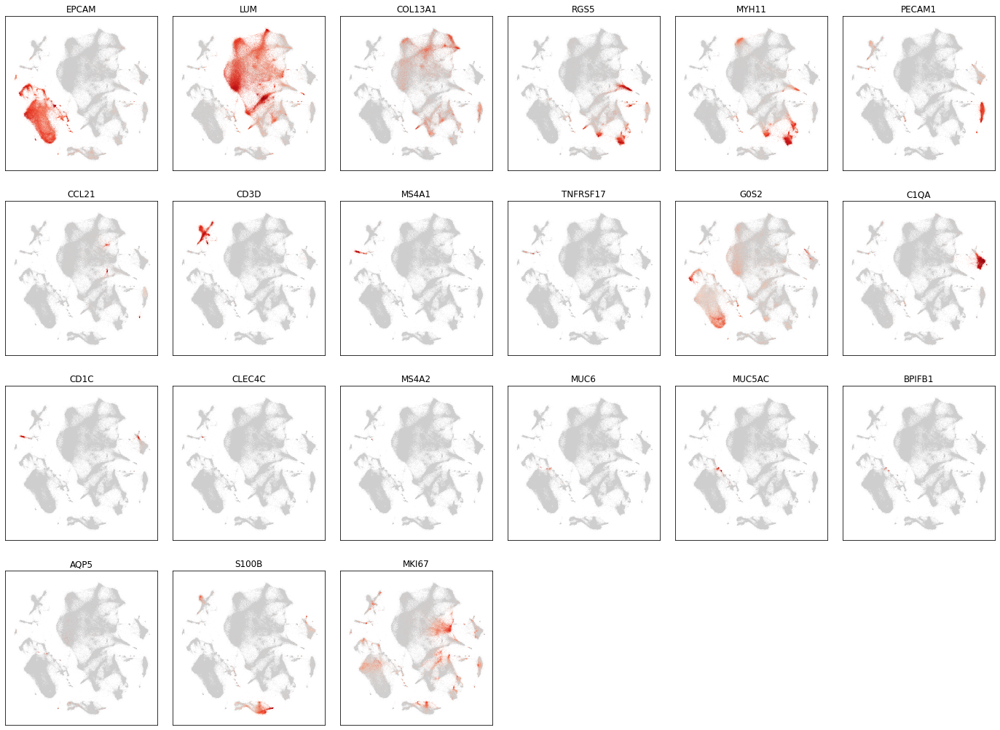

In [189]:
sk.plot_genes(
    aux_ads["fetal"],
    broad_markers,
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

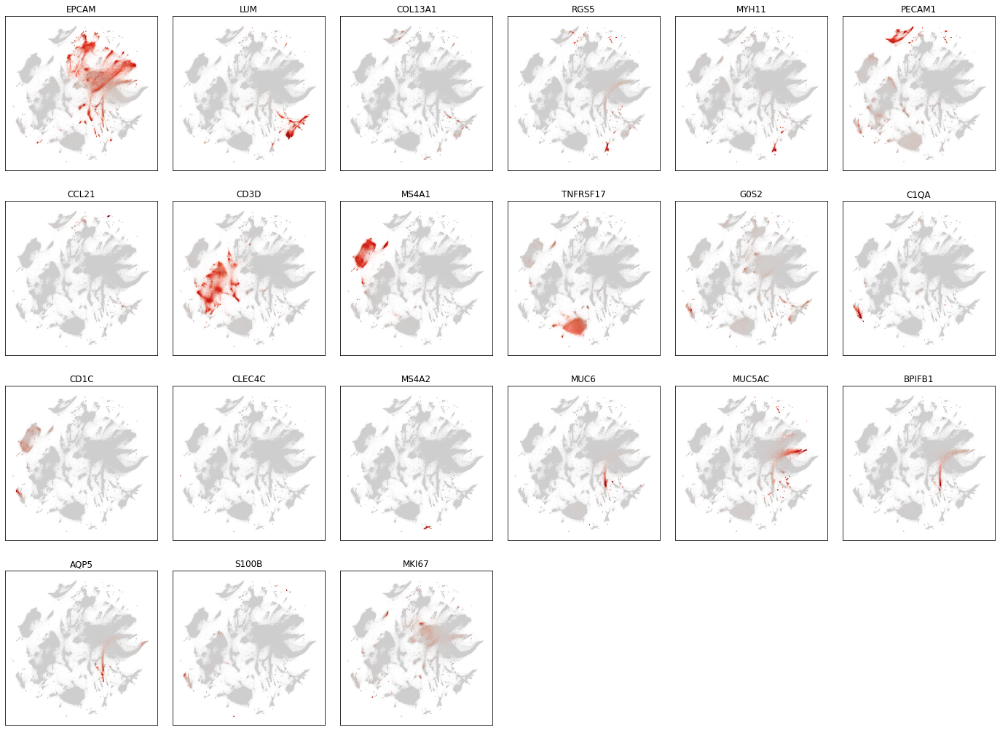

In [175]:
sk.plot_genes(
    aux_ads["non-fetal"],
    broad_markers,
    basis="mde",
    use_hexbin=False,
    figsize=(4, 4),
)

In [176]:
aux_ads["non-fetal"].obs["broad_annot_20220914"] = sk.regroup(
    aux_ads["non-fetal"],
    groupby="leiden_scvi_split6",
    regroups={
        "Epi": [
            "0",
            "2",
            "4",
            "5,0",
            "5,1",
            "5,2",
            "6,0",
            "8,0",
            "8,1",
            "9",
            "11",
            "12,0",
            "12,1",
        ],
        "Endo": ["13", "14,0", "14,2"],
        "Mes": ["7", "10"],
        "Neural": ["12,2", "14,1"],
        "B": ["1", "3,1", "3,2", "8,2", "8,3"],
        "T": ["15"],
        "Myeloid": ["6,1", "16"],
        "Doublet B+T": ["3,0"],
    },
)

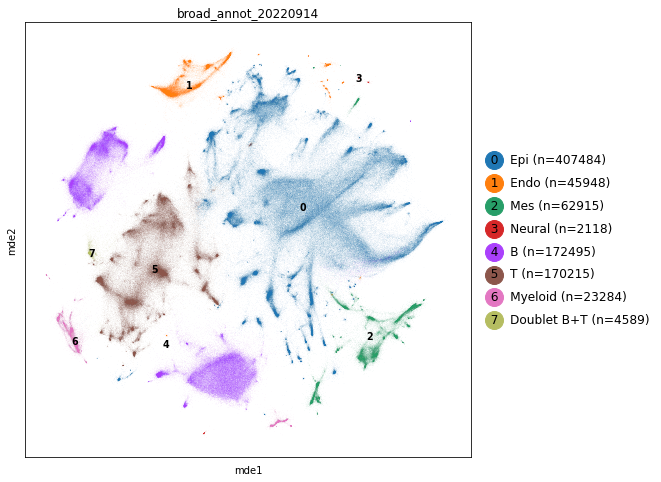

In [190]:
sk.clear_colors(aux_ads["non-fetal"])
sk.plot_embedding(
    aux_ads["non-fetal"],
    basis="mde",
    groupby="broad_annot_20220914",
    annot="full",
    figsize=(8, 8),
    # size=1,
);

In [193]:
aux_ads["non-fetal"].obs["broad_annot_20220914"].to_csv(
    "annotation/broad_annotation.non-fetal.20220914.csv.gz"
)

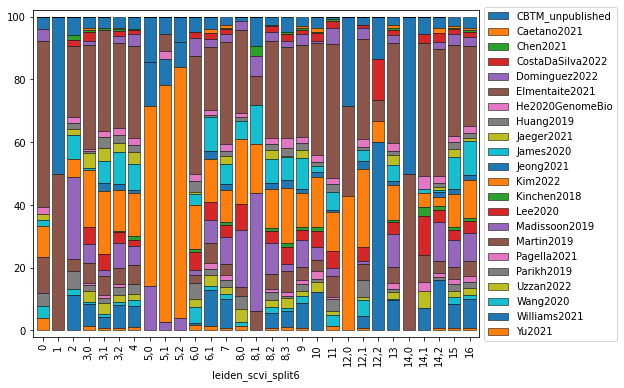

In [133]:
sk.set_figsize((8, 6))
sk._plot.plot_composition(
    aux_ads["non-fetal"], "study", groupby="leiden_scvi_split6", sample="sampleID"
);

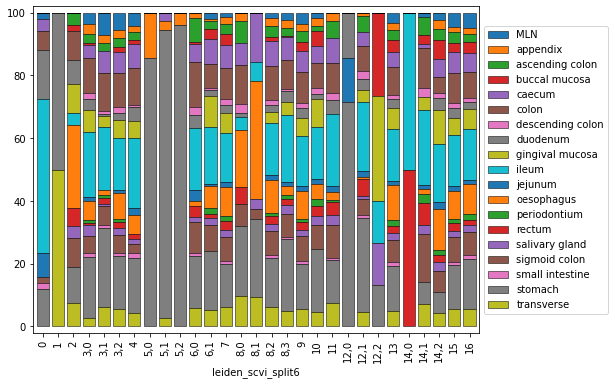

In [134]:
sk.set_figsize((8, 6))
sk._plot.plot_composition(
    aux_ads["non-fetal"],
    "organ_unified",
    groupby="leiden_scvi_split6",
    sample="sampleID",
);

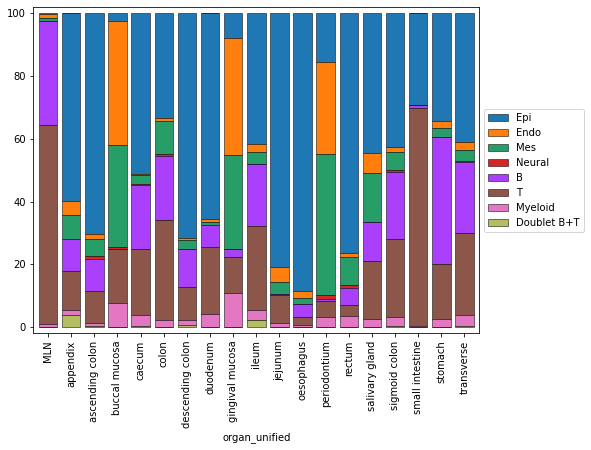

In [191]:
sk.set_figsize((8, 6))
sk._plot.plot_composition(
    aux_ads["non-fetal"],
    groupby="organ_unified",
    composition="broad_annot_20220914",
    sample="sampleID",
);

### Check marker genes

In [167]:
cluster = "broad_annot_20220914"

In [168]:
ds_aux_ads = {}
for name in ("fetal", "non-fetal"):
    ds_aux_ads[name] = sk.subsample(aux_ads[name], 1, groupby=cluster, max_n=200)

In [169]:
ds_aux_mksts = {}
for name in ("fetal", "non-fetal"):
    sc.pp.normalize_total(ds_aux_ads[name], target_sum=1e4)
    sc.pp.log1p(ds_aux_ads[name])
    ds_aux_mksts[name] = sk.calc_marker_stats(
        ds_aux_ads[name], groupby=cluster, use_rep="X"
    )

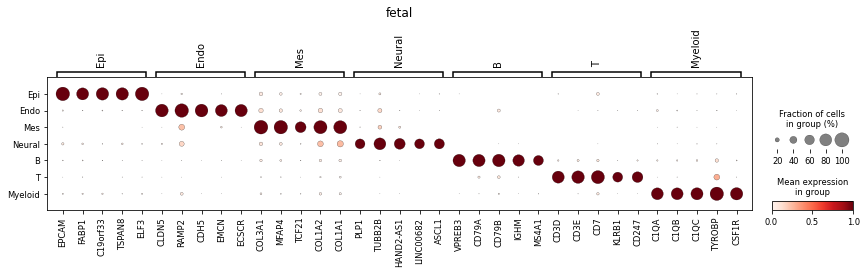

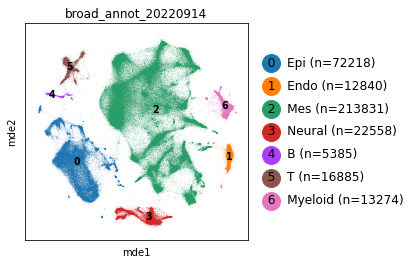

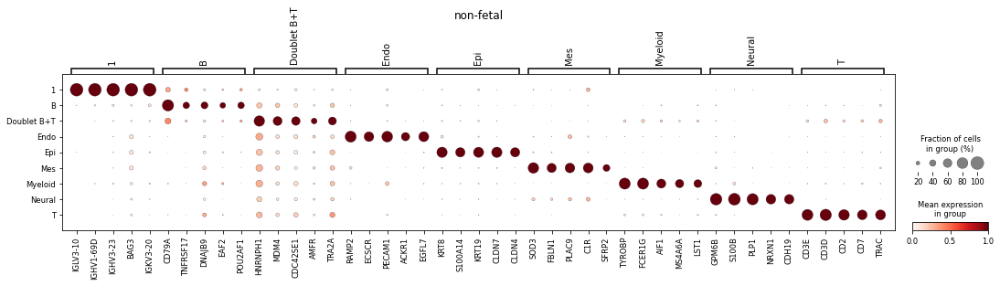

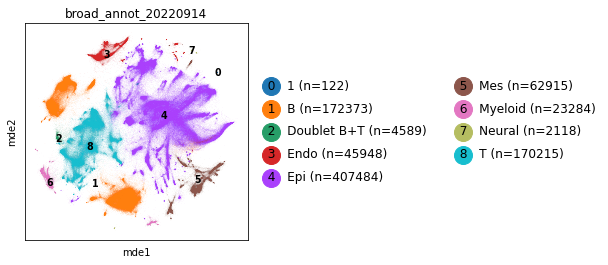

In [170]:
for name, mkst in ds_aux_mksts.items():
    mks = sk.filter_marker_stats(
        mkst[2], use_rep="X", max_next_frac=0.5, single=True, how="and"
    )
    sk.plot_markers(
        ds_aux_ads[name], groupby=cluster, mks=mks, standard_scale="var", title=name
    )
    sk.plot_embedding(
        aux_ads[name], basis="mde", groupby=cluster, annot="full", figsize=(4, 4)
    );

In [25]:
ad.obs["broad_annotation_20220803"].to_csv(
    "annotation/broad_annotation_20220803.csv.gz"
)

/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


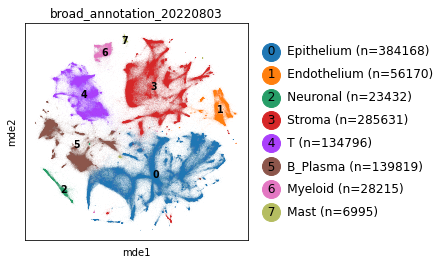

In [26]:
sk.plot_embedding(
    ad, basis="mde", groupby="broad_annotation_20220803", annot="full", figsize=(4, 4)
);

In [87]:
adS = sk.subsample(ad, 1, groupby="broad_annotation_20220803", max_n=5000)

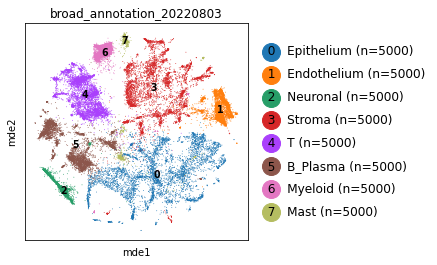

In [88]:
sk.plot_embedding(
    adS, basis="mde", groupby="broad_annotation_20220803", annot="full", figsize=(4, 4)
);

In [89]:
sc.pp.normalize_total(adS, target_sum=1e4)
sc.pp.log1p(adS)

In [90]:
mkst = sk.calc_marker_stats(adS, groupby="broad_annotation_20220803", use_rep="X")

In [91]:
mks = sk.filter_marker_stats(mkst[2], max_next_frac=0.5, single=True, how="and")

/nfs/users/nfs_n/nh3/src/github/nh3/sctk/sctk/_markers.py:236: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  filtered["top_frac_group"].cat.reorder_categories(


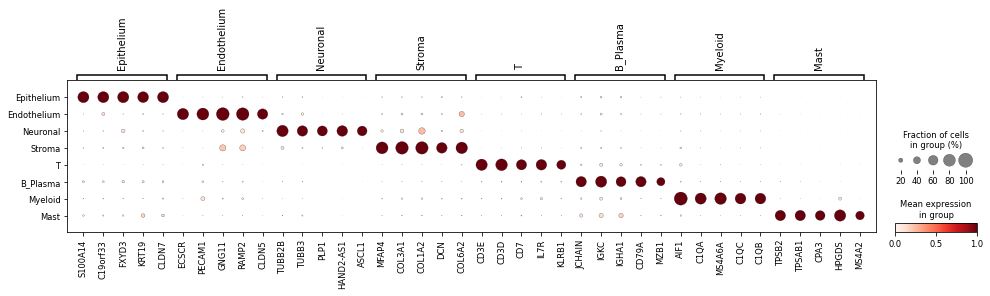

In [92]:
sk.plot_markers(adS, groupby="broad_annotation_20220803", mks=mks, standard_scale="var")

In [28]:
ad.var["cc"] = ad.var_names.isin(cc_genes)
ad.var["ig"] = ad.var_names.isin(ig_genes)
ad.var["tcr"] = ad.var_names.isin(tcr_genes)

In [29]:
ad

AnnData object with n_obs × n_vars = 1059226 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'ctp_pred', 'ctp_pred_prob', 'ctp_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced', 'percent_top50_spliced', 'n_counts_unspliced', 'log1p_n_counts_unspliced', 'n_genes_unspliced', 'log1p_n_genes_unspliced', 'percent_mito_unspliced', 'n_counts_mito_unspliced', 'percent_ribo_unspliced', 'n_counts_ribo_un

In [30]:
ad.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.filtered.included_samples.mito80_stringent_doublet.hvg7500_noCC.processed.broadly_annotated.h5ad",
    compression="gzip",
)

## Zoom-in

In [32]:
del aux_ad, ad

In [33]:
gc.collect()

571

In [13]:
ad = anndata.AnnData(
    **sk.read_h5ad(
        "h5ad/pooled/pooled_healthy.gene_cellbender.filtered.included_samples.mito80_stringent_doublet.hvg7500_noCC.processed.broadly_annotated.h5ad",
        component=["X", "obs", "var", "obsm"],
    )
)

In [14]:
broad_ads = sk.split_by_group(ad, groupby="broad_annotation_20220803")

In [15]:
broad_ads["Epithelium"]

AnnData object with n_obs × n_vars = 384168 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'ctp_pred', 'ctp_pred_prob', 'ctp_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced', 'percent_top50_spliced', 'n_counts_unspliced', 'log1p_n_counts_unspliced', 'n_genes_unspliced', 'log1p_n_genes_unspliced', 'percent_mito_unspliced', 'n_counts_mito_unspliced', 'percent_ribo_unspliced', 'n_counts_ribo_uns

In [16]:
del ad

In [100]:
broad_ads.keys()

dict_keys(['B_Plasma', 'Endothelium', 'Epithelium', 'Mast', 'Myeloid', 'Neuronal', 'Stroma', 'T'])

B_Plasma


/software/team205/miniconda3/envs/rapids-torch/lib/python3.8/site-packages/scvi/model/_utils.py:266: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [13:52<00:00,  2.08s/it, loss=424, v_num=1]
Endothelium


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [14:08<00:00,  2.12s/it, loss=1.23e+03, v_num=1]
Epithelium


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [14:37<00:00,  2.19s/it, loss=1.19e+03, v_num=1]
Mast


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [03:08<00:00,  2.13it/s, loss=749, v_num=1] 
Myeloid


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [14:01<00:00,  2.10s/it, loss=1.01e+03, v_num=1]
Neuronal


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [11:27<00:00,  1.72s/it, loss=1.33e+03, v_num=1]
Stroma


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [14:17<00:00,  2.14s/it, loss=978, v_num=1]   
T


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [13:55<00:00,  2.09s/it, loss=799, v_num=1]


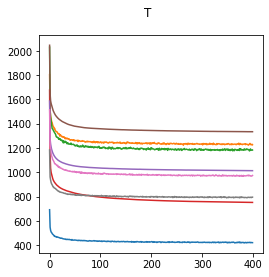

In [110]:
for ct, b_ad in broad_ads.items():
    print(ct)
    good_batches = sk.get_good_sized_batch(b_ad.obs.donor, min_size=30)
    k = np.where(b_ad.obs.donor.isin(good_batches))[0]

    ct_ad = anndata.AnnData(X=b_ad.X, obs=b_ad.obs, var=b_ad.var)
    sc.pp.highly_variable_genes(
        ct_ad,
        flavor="seurat_v3",
        n_top_genes=7500,
        subset=True,
    )
    remove_genes = cc_genes.to_list()
    if ct == "B_Plasma":
        remove_genes.extend(ig_genes.to_list())
    ct_ad = ct_ad[:, ~ct_ad.var_names.isin(remove_genes)].copy()
    ct_ad = ct_ad[k].copy()

    scvi.model.SCVI.setup_anndata(
        ct_ad,
        batch_key="donor",
        categorical_covariate_keys=["study"],
        continuous_covariate_keys=["log1p_n_counts", "percent_mito"],
    )

    vae = scvi.model.SCVI(ct_ad, n_latent=20, **arches_params)

    vae.train(
        train_size=0.9,
        early_stopping_patience=45,
        max_epochs=400,
        batch_size=256,
        limit_train_batches=100,
        use_gpu=True,
    )
    plt.plot(vae.history["elbo_train"])
    plt.suptitle(ct)
    b_ad.obsm["X_scvi_ct"] = np.empty((b_ad.n_obs, 20))
    b_ad.obsm["X_scvi_ct"][:] = np.nan
    b_ad.obsm["X_scvi_ct"][k, :] = vae.get_latent_representation()
    joblib.dump(
        vae,
        f"model/{ct}.gene_cellbender.qc_filtered.no_stringent_doublet.scvi_vae.lv20_batch256.pkl",
        compress=3,
    )
    del vae, ct_ad
    gc.collect()

In [113]:
broad_ads.values()

dict_values([AnnData object with n_obs × n_vars = 139819 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'ctp_pred', 'ctp_pred_prob', 'ctp_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced', 'percent_top50_spliced', 'n_counts_unspliced', 'log1p_n_counts_unspliced', 'n_genes_unspliced', 'log1p_n_genes_unspliced', 'percent_mito_unspliced', 'n_counts_mito_unspliced', 'percent_ribo_unspliced', 'n_co

In [120]:
gc.collect()

1509

In [121]:
for ct, b_ad in broad_ads.items():
    print(ct)
    good_batches = sk.get_good_sized_batch(b_ad.obs.donor, min_size=30)
    in_good_batch = b_ad.obs.donor.isin(good_batches)
    k = np.where(in_good_batch)[0]

    mde_obj = run_mde(b_ad.obsm["X_scvi_ct"][k, :])
    b_ad.obsm["X_mde_ct"] = np.empty((b_ad.n_obs, 2))
    b_ad.obsm["X_mde_ct"][:] = np.nan
    b_ad.obsm["X_mde_ct"][k, :] = mde_embed(mde_obj)

    aux_ad = anndata.AnnData(X=b_ad.X[k, :], obs=b_ad.obs.iloc[k], var=b_ad.var)
    aux_ad.obsm["X_scvi_ct"] = b_ad.obsm["X_scvi_ct"][k, :]
    sc.pp.neighbors(
        aux_ad,
        use_rep="X_scvi_ct",
        n_pcs=20,
        method="rapids",
        key_added="neighbors_ct_rapids",
    )
    sc.tl.umap(aux_ad, neighbors_key="neighbors_ct_rapids", method="rapids")
    b_ad.obsm["X_umap_ct"] = np.empty((b_ad.n_obs, 2))
    b_ad.obsm["X_umap_ct"][:] = np.nan
    b_ad.obsm["X_umap_ct"][k, :] = aux_ad.obsm["X_umap"]

    b_ad.obs["donor_n_cell_gt30"] = False
    b_ad.obs.loc[in_good_batch, "donor_n_cell_gt30"] = True

B_Plasma
Endothelium
Epithelium
Mast
Myeloid
Neuronal
Stroma
T


In [20]:
for ct, b_ad in broad_ads.items():
    print(ct)
    good_batches = sk.get_good_sized_batch(b_ad.obs.donor, min_size=30)
    in_good_batch = b_ad.obs.donor.isin(good_batches)
    k = np.where(in_good_batch)[0]
    vae = joblib.load(
        f"model/{ct}.gene_cellbender.qc_filtered.no_stringent_doublet.scvi_vae.lv20_batch256.pkl"
    )

    b_ad.obsm["X_scvi_ct"] = np.empty((b_ad.n_obs, 20))
    b_ad.obsm["X_scvi_ct"][:] = np.nan
    b_ad.obsm["X_scvi_ct"][k, :] = vae.get_latent_representation()

    mde_obj = run_mde(b_ad.obsm["X_scvi_ct"][k, :])
    b_ad.obsm["X_mde_ct"] = np.empty((b_ad.n_obs, 2))
    b_ad.obsm["X_mde_ct"][:] = np.nan
    b_ad.obsm["X_mde_ct"][k, :] = mde_embed(mde_obj)

    aux_ad = anndata.AnnData(X=b_ad.X[k, :], obs=b_ad.obs.iloc[k], var=b_ad.var)
    aux_ad.obsm["X_scvi_ct"] = b_ad.obsm["X_scvi_ct"][k, :]
    sc.pp.neighbors(
        aux_ad,
        use_rep="X_scvi_ct",
        n_pcs=20,
        method="rapids",
        key_added="neighbors_ct_rapids",
    )
    sc.tl.umap(aux_ad, neighbors_key="neighbors_ct_rapids", method="rapids")
    b_ad.obsm["X_umap_ct"] = np.empty((b_ad.n_obs, 2))
    b_ad.obsm["X_umap_ct"][:] = np.nan
    b_ad.obsm["X_umap_ct"][k, :] = aux_ad.obsm["X_umap"]

    b_ad.obs["donor_n_cell_gt30"] = False
    b_ad.obs.loc[in_good_batch, "donor_n_cell_gt30"] = True

B_Plasma
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                  
Endothelium
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Epithelium
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Mast
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Myeloid
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Neuronal
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
Stroma
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       
T
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       


In [36]:
for ct, b_ad in broad_ads.items():
    sk.clear_colors(b_ad)
    b_ad.write(
        f"h5ad/compartment/pooled_healthy.gene_cellbender.qc_filtered.post_scrublet.{ct}.20220805.h5ad",
        compression="gzip",
    )

In [21]:
broad_ads["Epithelium"]

AnnData object with n_obs × n_vars = 384168 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'ctp_pred', 'ctp_pred_prob', 'ctp_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spliced', 'percent_top50_spliced', 'n_counts_unspliced', 'log1p_n_counts_unspliced', 'n_genes_unspliced', 'log1p_n_genes_unspliced', 'percent_mito_unspliced', 'n_counts_mito_unspliced', 'percent_ribo_unspliced', 'n_counts_ribo_uns

In [40]:
broad_ads["B_Plasma"].obs.annotated.value_counts()

True     108916
False     30903
Name: annotated, dtype: int64

In [42]:
pd.crosstab(
    [
        broad_ads["B_Plasma"].obs.good_qc_cluster_mito20,
        broad_ads["B_Plasma"].obs.doublet,
    ],
    broad_ads["B_Plasma"].obs.annotated,
)

annotated                       False    True
good_qc_cluster_mito20 doublet               
False                  False    18243       0
                       True       758       0
True                   False     9536  106667
                       True      2366    2249

In [43]:
pd.crosstab(
    broad_ads["B_Plasma"].obs.good_qc_cluster_mito20,
    broad_ads["B_Plasma"].obs.annotated,
)

annotated,False,True
good_qc_cluster_mito20,,
False,19001,0
True,11902,108916


In [25]:
broad_ads.keys()

dict_keys(['B_Plasma', 'Endothelium', 'Epithelium', 'Mast', 'Myeloid', 'Neuronal', 'Stroma', 'T'])

In [ ]:
for ct, b_ad in broad_ads.items():
    k = b_ad.obs.donor_n_cell_gt30.values
    for basis in ["mde_ct", "umap_ct"]:
        sc.pl.embedding(
            b_ad, basis=basis, color="annot_20220620", title=f"{ct}, {basis}"
        )

In [38]:
for ct, b_ad in broad_ads.items():
    ct_h5ad = f"h5ad/compartment/pooled_healthy.gene_cellbender.qc_filtered.post_scrublet.{ct}.20220805.h5ad"
    !rclone copy {ct_h5ad} google:/projects/CD_gut/data/remap_h5ad/v2/for_annotation/20220805/